# Incorporate Safety Specification to Learned Specification from User Demonstration on Seshia Paper's Env 

by Kandai Watanabe (kandai.watanabe@colorado.edu / kandai.wata@gmail.com)

or reach me out on github (https://github.com/watakandai)


**FOR SESHIA's paper on Learning Task Specifications from Demonstrations:**

In this notebook, we're going to incorporate safety specification to a learned specification (liveness) to safety navigate to a goal. 

We will then apply the composed specification to an environment with a different robot / environmental dynamics, but with the same intended goal as in the environment where we demonstrated the task.

This shows that we can actually learn the intended task the user had in mind when they demonstrate it on a system with actual dynamics, maitain safety, and then apply that specification to a different environment.



Change up to the main repo directory:

In [1]:
import os
os.chdir(os.path.join('..', '..'))

In [2]:
%load_ext autoreload
%autoreload 2
import gym
from IPython.display import Video, display
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from pathlib import Path
import itertools
import numpy as np
import matplotlib.pyplot as plt

from wombats.systems import (StaticMinigridTSWrapper,
                             LavaComparison_noDryingOff)
from wombats.automaton import active_automata
from wombats.automaton import MinigridTransitionSystem
from wombats.learning import FlexfringeInterface, TracesGenerator, DummyEstimator, BatchEstimator, ComparativeEvaluation
from wombats.learning import VanillaSL, PostprocessSL, GreedyPreprocessSL, PreprocessSL, TargetSpecification
from wombats.learning import Dataset
from wombats.automaton import Automaton
from wombats.utils import get_experiment_paths

# setting all paths
ENV_ID_0 = 'MiniGrid-LavaComparison_SeshiaSecondGoal-v0'
ENV_ID_1 = 'MiniGrid-LavaComparison_seshia-v0'

EXPERIMENT_NAME = 'safe_pdfa_learning_performance_analysis'
path_data = get_experiment_paths(EXPERIMENT_NAME)
EXPERIMENT_DIR = path_data['EXPERIMENT_DIR']
PDFA_MODEL_CONFIG_FILE = path_data['PDFA_MODEL_CONFIG_FILE']
DFA_MODEL_CONFIG_FILE = path_data['DFA_MODEL_CONFIG_FILE']
LEARNER_DATA_DIR = path_data['LEARNER_DATA_DIR']
LEARNING_TRAIN_DATA_REL_FILEPATH = path_data['LEARNING_TRAIN_DATA_REL_FILEPATH']
LEARNING_TEST_DATA_REL_FILEPATH = path_data['LEARNING_TEST_DATA_REL_FILEPATH']
GYM_MONITOR_LOG_DIR = path_data['GYM_MONITOR_LOG_DIR']
Automaton.automata_data_dir = os.path.join(EXPERIMENT_DIR)
path_data


test_size = 0.2
num_samples = np.logspace(2, 4, num=5)
Ns =  [20]

In [3]:
def load_automata_from_experiment(experiment_name, env_id, draw=False, just_cosafe=False):
    path_data = get_experiment_paths(experiment_name)
    pdfa_model_config_file = path_data['PDFA_MODEL_CONFIG_FILE']
    dfa_model_config_file = path_data['DFA_MODEL_CONFIG_FILE']
    
    # cosafe
    try:
        cosafe_specification = active_automata.get(automaton_type='PDFA',
                                                   graph_data=pdfa_model_config_file,
                                                   is_normalized=True)
    except Exception as e:
        cosafe_specification = None
        
    # safe
    try:
        safe_specification = active_automata.get(automaton_type='DFA',
                                                 graph_data=dfa_model_config_file)
    except Exception as e:
        safe_specification = None
    
    # pdfa
    try:
        pdfa_specification = active_automata.get(automaton_type='PDFA',
                                                 graph_data=(cosafe_specification,
                                                             safe_specification),
                                                 graph_data_format='existing_objects',
                                                 normalize_trans_probabilities=True)
    except Exception as e:
        pdfa_specification = None
    
    # env
    env = gym.make(env_id)

    env = StaticMinigridTSWrapper(env, actions_type='simple_static',
                                  monitor_log_location=GYM_MONITOR_LOG_DIR)
    env.reset()

    minigrid_TS = active_automata.get(automaton_type='TS', graph_data=env,
                                      graph_data_format='minigrid')
    
    if draw: 
        try:
            cosafe_specification.draw('_'.join([EXPERIMENT_NAME, env_id, 'PDFA']))
            safe_specification.draw('_'.join([EXPERIMENT_NAME, env_id, 'DFA']))
            pdfa_specification.draw('_'.join([EXPERIMENT_NAME, env_id, 'SPECIFICATION']))
            env.render_notebook()
        
        except Exception as e:
            print(e)
#         minigrid_TS.draw('_'.join([EXPERIMENT_NAME, env_id, 'TS']))
    
    if just_cosafe:
        return cosafe_specification, minigrid_TS
    return pdfa_specification, safe_specification, minigrid_TS

## Seshia Paper's Reproduction WITH safety specification
**For the Experiment WITHOUT safety specification is provided in another jupyter notebook script called "seshia_paper_reproduction.ipynb"**


Given 5 Demonstrations (Samples) $S$ AND a safety specification $\varphi_{safe}$, 

Learn a full specification of the task such that it does not violate safety.

$$ Pr(\mathcal{A}_{est}) \approx Pr(L(\varphi)) \quad s.t. Pr(\omega \models \lnot \varphi_{safe}) = 0, \forall \omega \in L(\mathcal{A})$$

where task specification is a conjunction of cosafe (liveness) and safe properties

$$ \varphi = \varphi_{cosafe} \land \varphi_{safe} \quad$$


In this jupyter notebook, we will also show how few algorithms with different hypterparameters can be run, evaluated, plotted and drawn in batch.

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


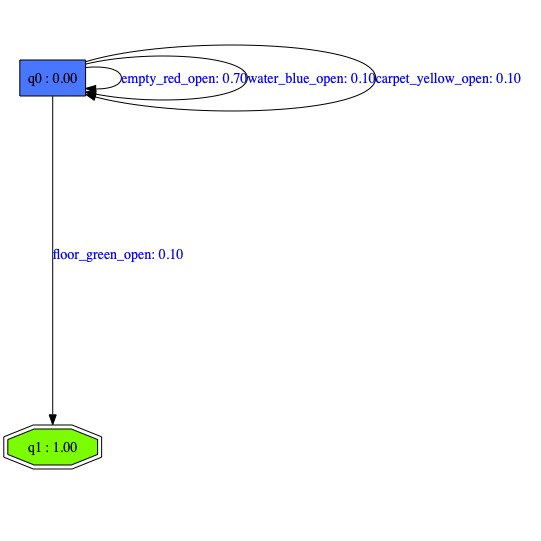

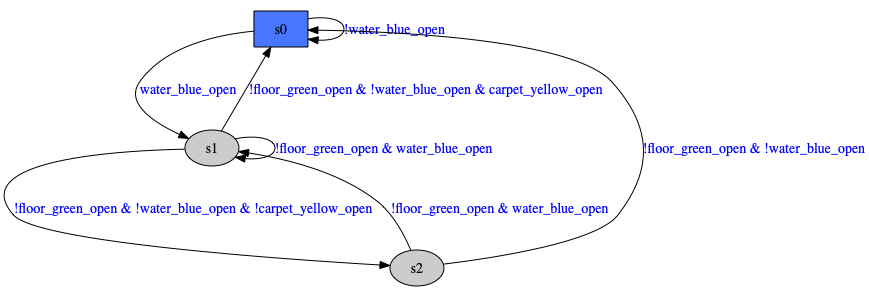

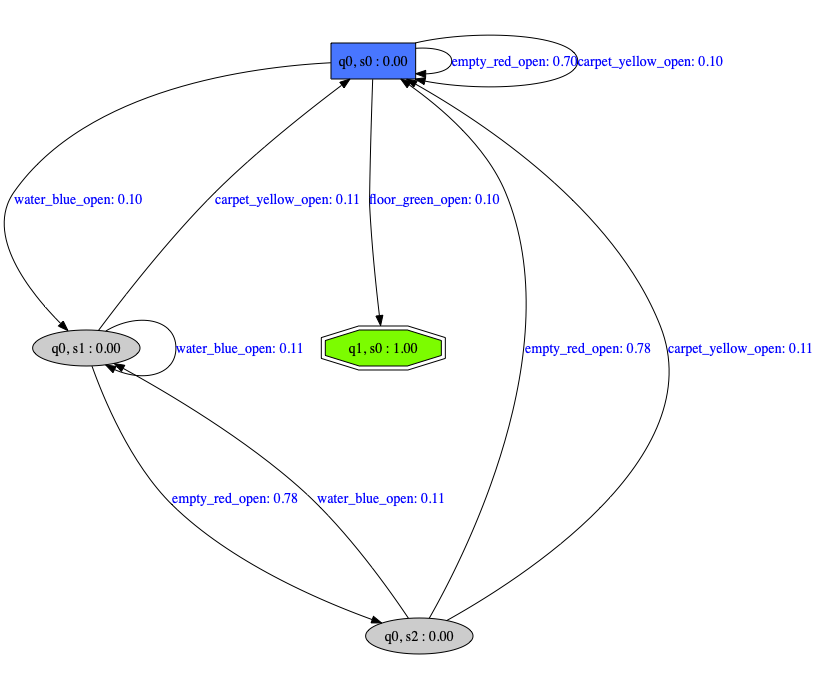

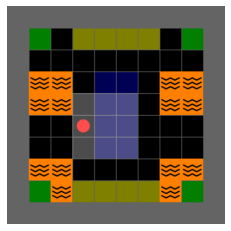

In [7]:
# Target specification
experiment_name = 'merge_safety_to_seshia_paper'
env_id = ENV_ID_1

pdfa_specification, safe_specification, minigrid_TS = load_automata_from_experiment(experiment_name, env_id, draw=True)

In [27]:
# 5 Demonstrations

a = minigrid_TS.actions
paper_controls = []
paper_controls.append([a.north, a.north, a.north, a.west, a.north, a.west])
paper_controls.append([a.north, a.north, a.north, a.north, a.west, a.west])
paper_controls.append([a.north, a.north, a.east, a.west, a.north, a.north, a.west, a.west])
paper_controls.append([a.north, a.east, a.north, a.north, a.north, a.west, a.west, a.west])
paper_controls.append([a.east, a.east, a.north, a.north, a.north, a.north, a.east, a.east, a.east])

paper_samples = [(controls, len(controls), None) for controls in paper_controls]

In [30]:
def eval_sampled_traces(traces, minigrid_TS):
    if traces is None:
        return
    
    output_strings = []
    for controls, length, prob in zip(*traces):
        if controls is None:
            continue
        output_string, _, video_path = minigrid_TS.run(
            controls)
        output_strings.append(output_string)
        
    return output_strings
words = eval_sampled_traces(zip(*paper_samples), minigrid_TS)
probs = [pdfa_specification.score(word) for word in words]
lengths = [len(word) for word in words]
print(words)

[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open']]


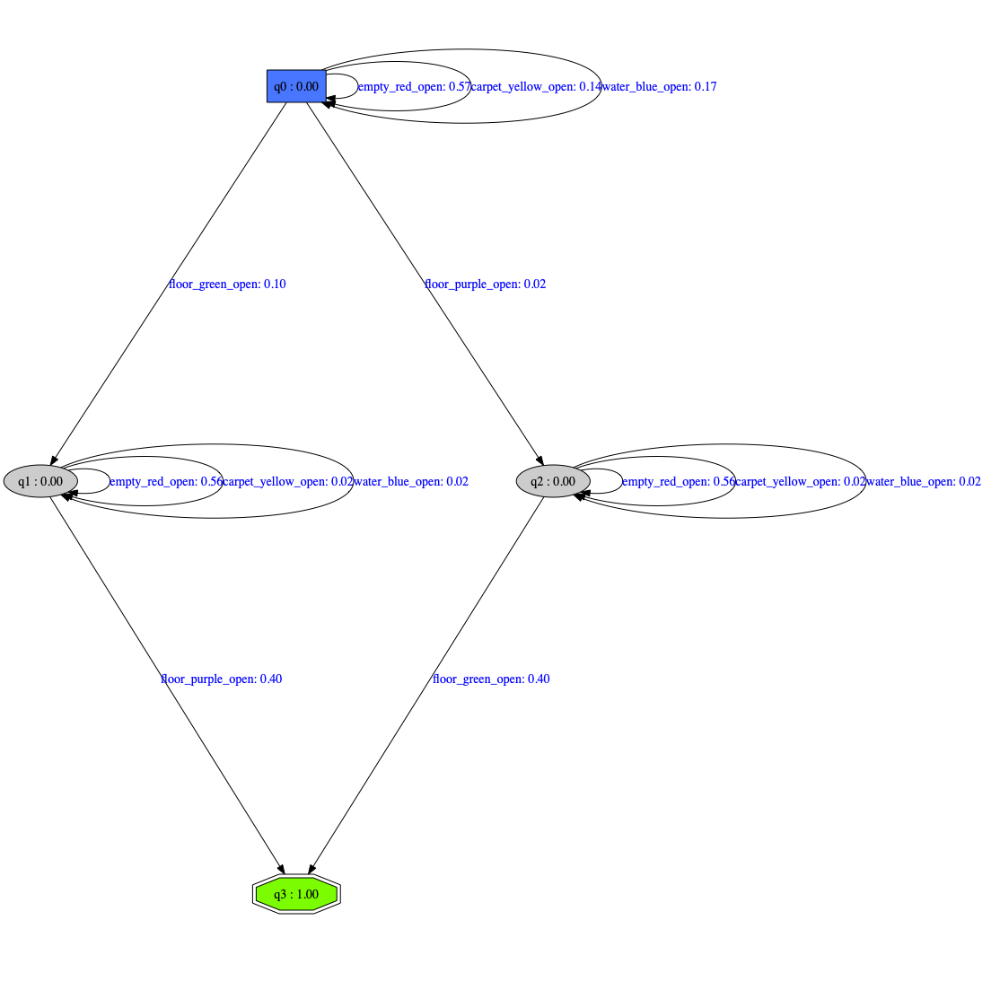

In [31]:
# Replace the probability distribution with that of the demonstrations

pdfa_specification.recompute_prob_dist(words)
pdfa_specification.draw('_'.join([EXPERIMENT_NAME, env_id, 'PDFA', 'ProbRecomputed']))

In [35]:
(X_train, X_test,
 y_train, y_test,
 l_train, l_test) = train_test_split(words,
                                     probs,
                                     lengths,
                                     test_size=0.05)

params = {'num_samples': len(words), 'N': max(lengths)}
dataset = Dataset(X_train, X_test,
                  y_train, y_test,
                  l_train, l_test,
                  LEARNER_DATA_DIR)
dataset.set_params(params)
dataset.set_pdfa(pdfa_specification)

In [36]:
# load data  & fit estimators
param_dict = {'num_samples':  num_samples}
datasets = [dataset]
# Create a pipeline
steps = [('clf', DummyEstimator())]
pipeline = Pipeline(steps=steps)

# Candidate learning algorithms and their hyperparameters
param_dict = [{'clf': [VanillaSL(), PostprocessSL(), PreprocessSL(), TargetSpecification()],
               'clf__specification': [pdfa_specification],
               'clf__safe_specification': [safe_specification],
               'clf__t': ['1'],
               'clf__p': ['0.6', '3.0', '5']}]

estimator = BatchEstimator(pipeline, param_dict)
estimator.fit(datasets)

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=1 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 1 , red: 1
m99965 blue: 2 , red: 1
No Merge was successful
x6 blue: 3 , red: 2
m99960 blue: 2 , red: 2
No Merge was successful
x6 blue: 3 , red: 3
No Merge was successful
m99963 blue: 2 , red: 3
No Merge was successful
x6 blue: 2 , red: 4
m99986 blue: 1 , red: 4
m99950 blue: 1 , red: 4
No Merge was successful
x8 blue: 2 , red: 5
No Merge was successful
x3 blue: 1 , red: 6
No Merge was successful
x1 blue: 0 , red: 7


found 

{'num_samples': 5, 'N': 10}
{'p': '0.6', 'clf': 'PreprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_merge_safety_to_seshia_paper.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=1 -l=0 -q=0 -y=0 -N=0 -T=1 -p=3.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 1 , red: 1
m99965 blue: 2 , red: 1
No Merge was successful
m99906 blue: 2 , red: 1
No Merge was successful
x6 blue: 3 , red: 2
m99935 blue: 2 , red: 2
No Merge was successful
x6 blue: 3 , red: 3
m99997 blue: 2 , red: 3
No Merge was successful
x6 blue: 2 , red: 4
m99766 blue: 2 , red: 4
No Merge w

In [37]:
evaluation = ComparativeEvaluation(estimator.experiments)
evaluation._df

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q0, s0) transition distribution
  warnings.warn(str(e))


,KL Divergence,L2 Norm of Trace Probabilities,L1 Norm of Trace Probabilities,No. of Nodes,Elapsed Time,Safe,num_samples,N,p,clf,pdfa
0,-0.139679,0.010244,0.011766,6,0.036447,1,5,10,0.6,VanillaSL,"(q0, q24, q25, q26, q22, q10)"
1,-0.000883,0.001073,0.001500,2,0.005080,0,5,10,3.0,VanillaSL,"(q0, q10)"
2,-0.001764,0.000865,0.000865,2,0.005349,0,5,10,5,VanillaSL,"(q0, q10)"
3,-0.139245,0.002818,0.003937,8,0.005664,1,5,10,0.6,PostprocessSL,"(q0, s0, q24, s1, q26, s0, q25, s2, q25, s1, q..."
4,-0.010036,0.005242,0.006035,5,0.007071,1,5,10,3.0,PostprocessSL,"(q0, s0, q0, s1, q10, s0, q0, s2, q10, s2)"
5,-0.009002,0.004840,0.005627,5,0.004741,1,5,10,5,PostprocessSL,"(q0, s0, q0, s1, q10, s0, q0, s2, q10, s2)"
6,-0.140517,0.003949,0.005242,9,0.006564,1,5,10,0.6,PreprocessSL,"(q0, q24, q25, q13, q14, q15, q21, q22, q10)"
7,0.002424,0.002896,0.003258,5,0.005572,1,5,10,3.0,PreprocessSL,"(q0, q24, q25, q26, q10)"
8,0.002946,0.002392,0.002577,4,0.005237,1,5,10,5,PreprocessSL,"(q0, q24, q25, q10)"
9,0.000000,0.000000,0.000000,4,0.000000,0,5,10,0.6,TargetSpecification,"(q0, q1, q2, q3)"


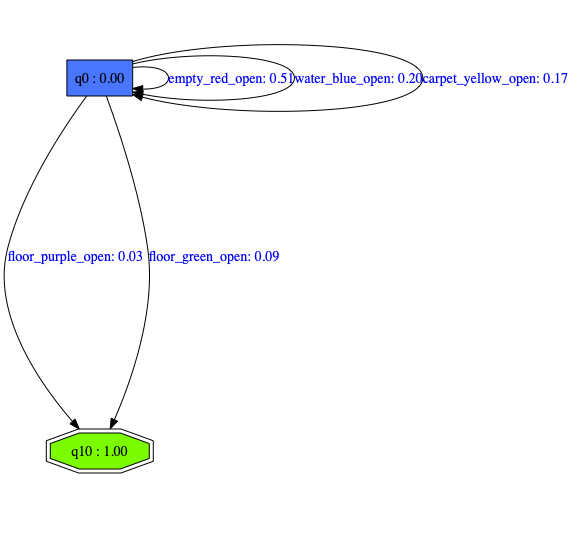

In [38]:
# Plot
selected_params = {'p': '3.0', 'N': params['N'], 'clf': 'VanillaSL'}
param_string = list(map(str,selected_params.values()))
filename = '_'.join([EXPERIMENT_NAME, env_id, 'PDFA', '_'.join(param_string)])
evaluation.pdfa(selected_params=selected_params).draw(filename)

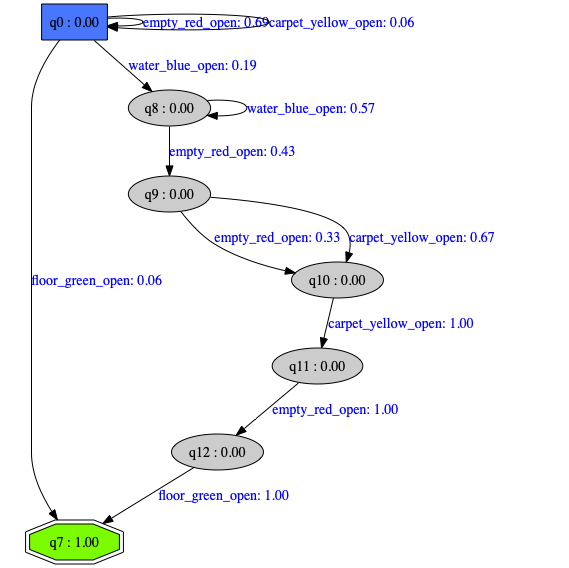

In [14]:
# Plot
selected_params = {'p': '3.0', 'N': params['N'], 'clf': 'PreprocessSL'}
param_string = list(map(str,selected_params.values()))
filename = '_'.join([EXPERIMENT_NAME, env_id, 'PDFA', '_'.join(param_string)])
evaluation.pdfa(selected_params=selected_params).draw(filename)

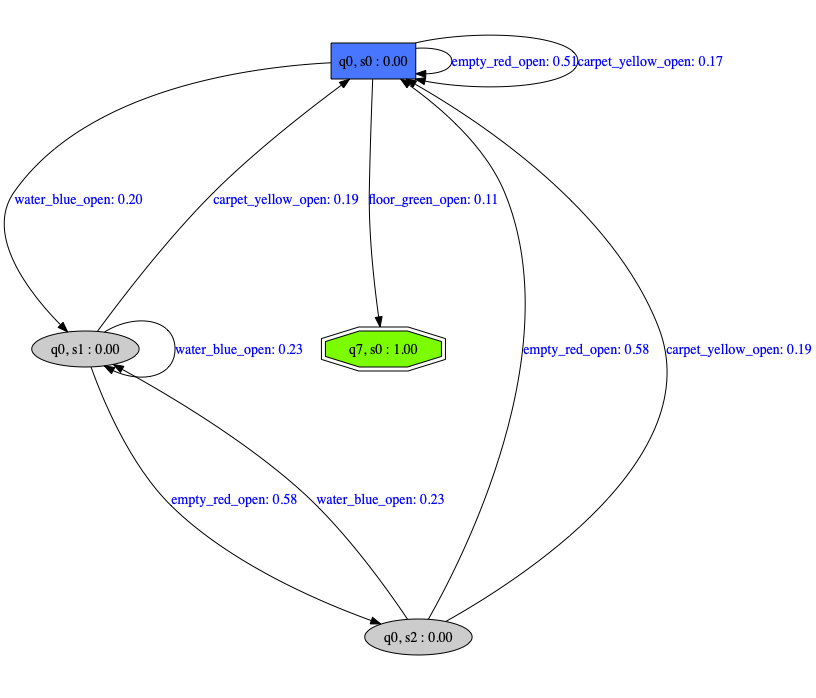

In [15]:
selected_params = {'p': '3.0', 'N': params['N'], 'clf': 'PostprocessSL'}
param_string = list(map(str,selected_params.values()))
filename = '_'.join([EXPERIMENT_NAME, env_id, 'PDFA', '_'.join(param_string)])
evaluation.pdfa(selected_params=selected_params).draw(filename)

# Experiment 2: 
## Task Specification Learning on 2 Goals Environment (WITHOUT Safety Specification)

Given demonstrations $S$,

Learng task specification, where the task is to visit 2 goals. 
$$ Pr(\mathcal{A}_{est}) \approx Pr(L(\varphi)) $$

where task is a conjunction of 2 cosafe properties

$$ \varphi = \varphi_1 \land \varphi_2 $$

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


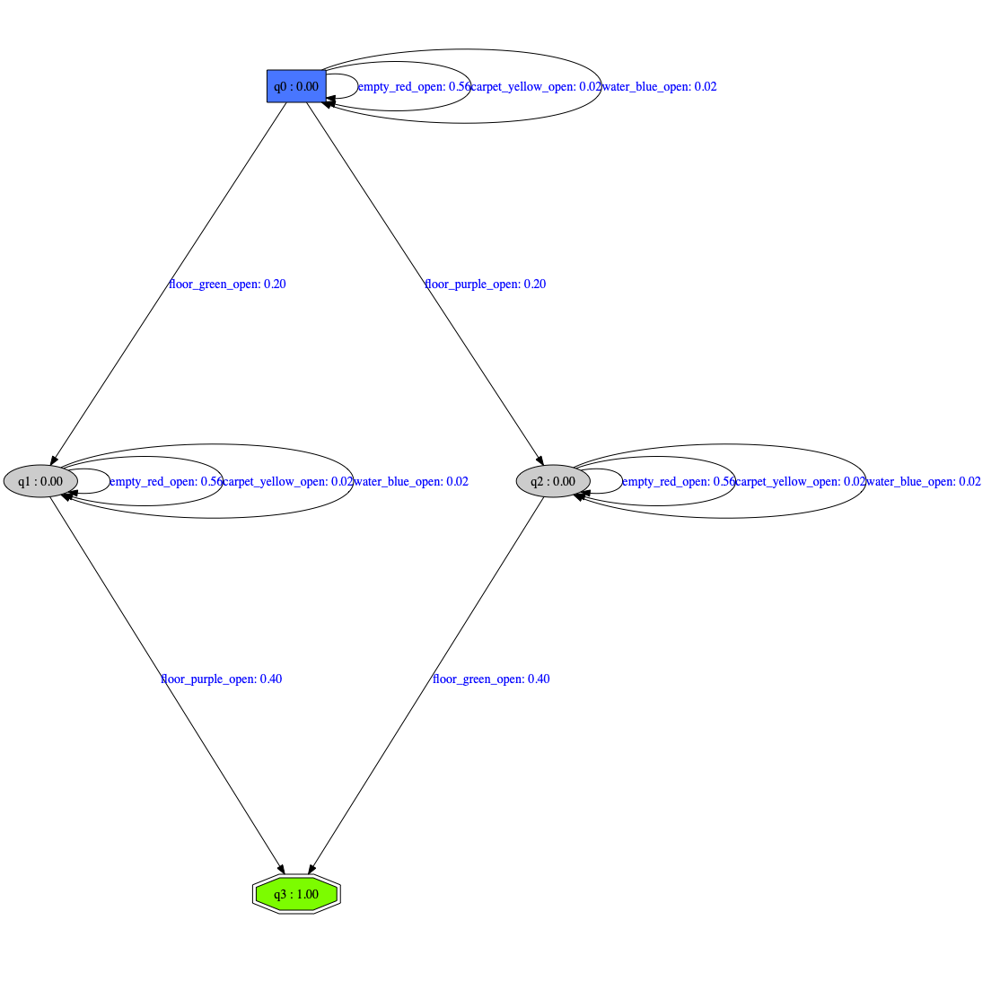

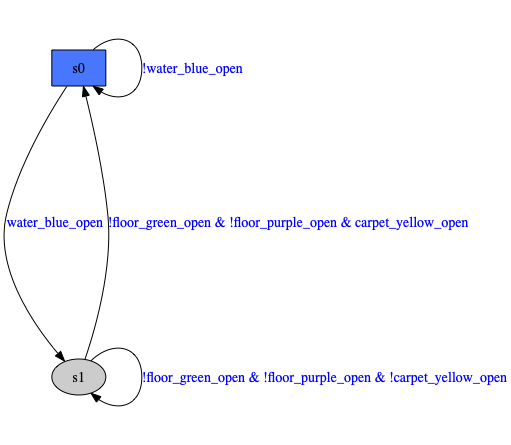

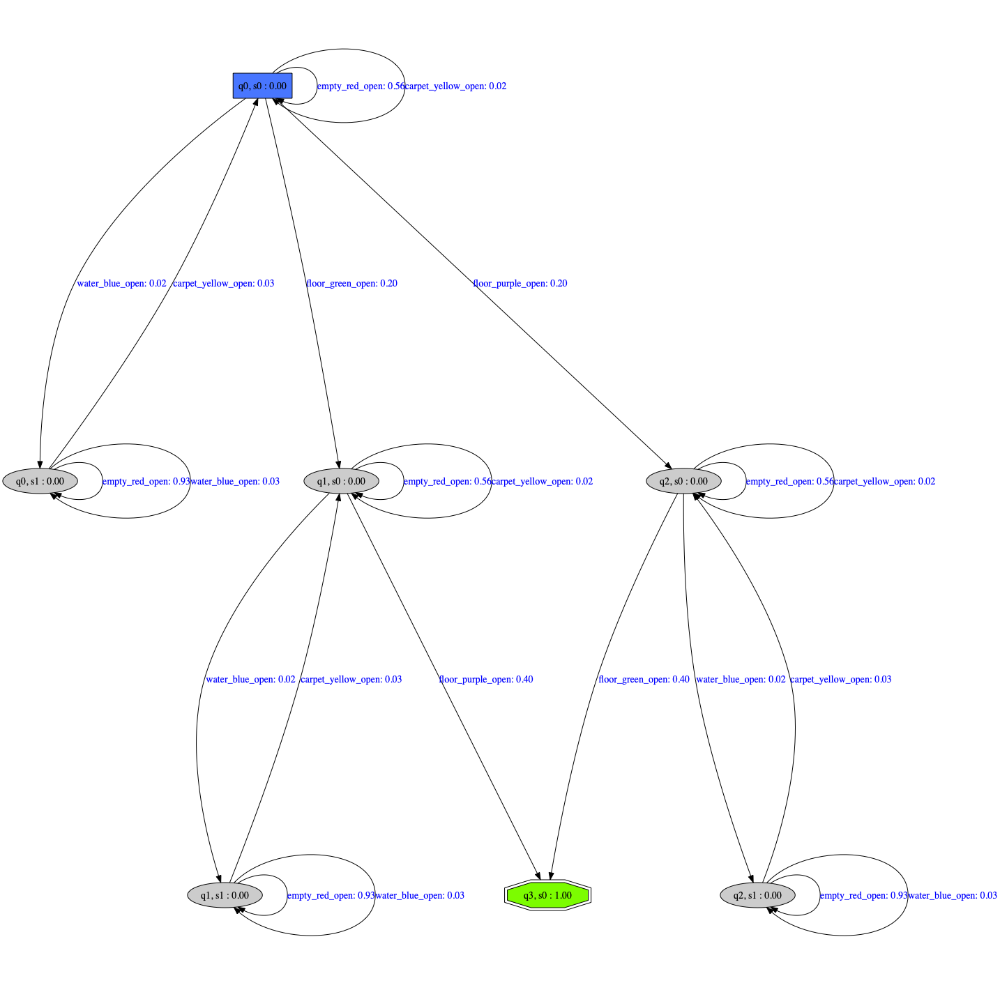

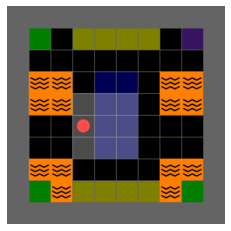

In [8]:
# env

experiment_name = 'safe_pdfa_learning_performance_analysis'
env_id = ENV_ID_0

pdfa_specification, minigrid_TS = load_automata_from_experiment(experiment_name, env_id, draw=True, just_cosafe=True)

In [9]:
# Generate Datasets
datagenerator = TracesGenerator(pdfa_specification, LEARNER_DATA_DIR)
param_dict = {'num_samples': num_samples,
              'N': Ns}
datagenerator.generate_datasets(param_dict)

In [10]:
# load data  & fit estimators


param_dict = {'num_samples':  num_samples}
datasets = datagenerator.select_datasets(param_dict)

# Create a pipeline
steps = [('clf', DummyEstimator())]
pipeline = Pipeline(steps=steps)

# Candidate learning algorithms and their hyperparameters
# param_dict = [{'clf': [VanillaSL(), PostprocessSL(), PreprocessSL(), TargetSpecification()],
param_dict = [{'clf': [VanillaSL(), TargetSpecification()],
               'clf__specification': [pdfa_specification],
               'clf__safe_specification': [safe_specification],
               'clf__p': ['5.0'],
              }]

estimator = BatchEstimator(pipeline, param_dict)
estimator.fit(datasets)

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=1 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99966 blue: 4 , red: 1
m99943 blue: 3 , red: 1
m99935 blue: 2 , red: 1
m99741 blue: 1 , red: 1
No Merge was successful
x160 blue: 4 , red: 2
m99965 blue: 3 , red: 2
m99884 blue: 3 , red: 2
No Merge was successful
m99887 blue: 2 , red: 2
No Merge was successful
x42 blue: 1 , red: 3
No Merge was successful
x38 blue: 0 , red: 4


found intermediate solution with 4 and 4 red states
No valid solver specified, skippin

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_purple_open) is not found in the curr_state's (q2) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q1) transition distribution
  warnings.warn(str(e))


welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=1 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99954 blue: 4 , red: 1
No Merge was successful
m99956 blue: 3 , red: 1
No Merge was successful
m99945 blue: 2 , red: 1
m99551 blue: 1 , red: 1
No Merge was successful
x506 blue: 5 , red: 2
m99963 blue: 4 , red: 2
m99941 blue: 3 , red: 2
m99921 blue: 2 , red: 2
No Merge was successful
x139 blue: 1 , red: 3
No Merge was successful
x114 blue: 0 , red: 4


found intermediate solution with 4 and 4 red states
No valid

{'N': 20, 'num_samples': 1000.0, 'actual_num_samples': 1000.0}
{'p': '5.0', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=1 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99973 blue: 4 , red: 1
m99960 blue: 3 , red: 1
m99954 blue: 2 , red: 1
No Merge was successful
x2558 blue: 5 , red: 2
No Merge was successful
m99960 blue: 4 , red: 2
No Merge was successful
m99952 blue: 3 , red: 2
No Merge was successful
m99938 blue: 2 , red: 2
No Merge was successful
x2502 blue: 5 , re

[Parallel(n_jobs=4)]: Done 344 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Done 408 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 440 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 633 out of 633 | elapsed:    1.1s finished
{'N': 20, 'num_samples': 3162.2776601683795, 'actual_num_samples': 3162.2776601683795}
{'p': '5.0', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=1 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:

[Parallel(n_jobs=4)]: Done 1934 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 1936 tasks      | elapsed:    7.3s
[Parallel(n_jobs=4)]: Done 1938 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 1940 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 1942 tasks      | elapsed:    7.4s
[Parallel(n_jobs=4)]: Done 1944 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 1946 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 1948 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 1950 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 1952 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 1954 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 1956 tasks      | elapsed:    7.5s
[Parallel(n_jobs=4)]: Done 1958 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 1960 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 1962 tasks      | elapsed:    7.6s
[Parallel(n_jobs=4)]: Done 1964 tasks      | elapsed:    7.6s
[Paralle

[Parallel(n_jobs=4)]: Done 1320 tasks      | elapsed:    5.7s
[Parallel(n_jobs=4)]: Done 1336 tasks      | elapsed:    5.7s
[Parallel(n_jobs=4)]: Done 1352 tasks      | elapsed:    6.0s
[Parallel(n_jobs=4)]: Done 1368 tasks      | elapsed:    6.0s
[Parallel(n_jobs=4)]: Done 1384 tasks      | elapsed:    6.1s
[Parallel(n_jobs=4)]: Done 1400 tasks      | elapsed:    6.2s
[Parallel(n_jobs=4)]: Done 1416 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 1432 tasks      | elapsed:    6.3s
[Parallel(n_jobs=4)]: Done 1448 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 1464 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 1480 tasks      | elapsed:    6.4s
[Parallel(n_jobs=4)]: Done 1496 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 1512 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 1528 tasks      | elapsed:    6.5s
[Parallel(n_jobs=4)]: Done 1544 tasks      | elapsed:    6.6s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    6.6s
[Paralle

In [11]:
evaluation = ComparativeEvaluation(estimator.experiments)
evaluation._df

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:415: RuntimeWarning: divide by zero encountered in log
  target_logscore = np.asscalar(np.log(target_prob) / np.log(base))


,KL Divergence,L2 Norm of Trace Probabilities,L1 Norm of Trace Probabilities,No. of Nodes,Elapsed Time,Safe,N,num_samples,actual_num_samples,p,clf,pdfa
0,-0.027919,0.003554,0.016810,3,0.014888,0,20,100.000000,100.000000,5.0,VanillaSL,"(q0, q11, q19)"
1,0.000000,0.000000,0.000000,4,0.000000,0,20,100.000000,100.000000,5.0,TargetSpecification,"(q0, q1, q2, q3)"
2,-0.019812,0.001797,0.014848,3,0.012466,0,20,316.227766,316.227766,5.0,VanillaSL,"(q0, q18, q80)"
3,0.000000,0.000000,0.000000,4,0.000000,0,20,316.227766,316.227766,5.0,TargetSpecification,"(q0, q1, q2, q3)"
4,-0.021139,0.000995,0.014251,3,0.023079,0,20,1000.000000,1000.000000,5.0,VanillaSL,"(q0, q11, q39)"
5,0.000000,0.000000,0.000000,4,0.000000,0,20,1000.000000,1000.000000,5.0,TargetSpecification,"(q0, q1, q2, q3)"
6,0.000117,0.000033,0.000843,4,0.042349,0,20,3162.277660,3162.277660,5.0,VanillaSL,"(q0, q17, q50, q22)"
7,0.000000,0.000000,0.000000,4,0.000000,0,20,3162.277660,3162.277660,5.0,TargetSpecification,"(q0, q1, q2, q3)"
8,0.000141,0.000007,0.000276,4,0.103802,0,20,10000.000000,10000.000000,5.0,VanillaSL,"(q0, q74, q103, q6)"
9,0.000000,0.000000,0.000000,4,0.000000,0,20,10000.000000,10000.000000,5.0,TargetSpecification,"(q0, q1, q2, q3)"


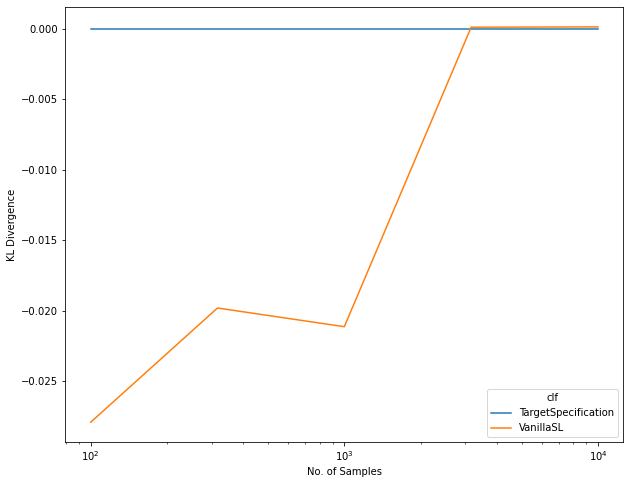

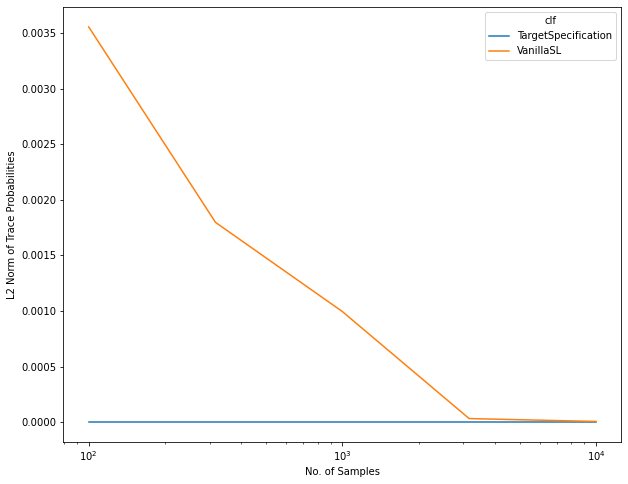

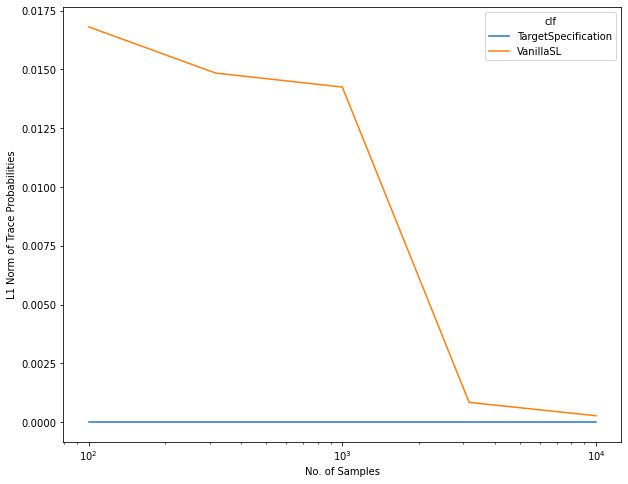

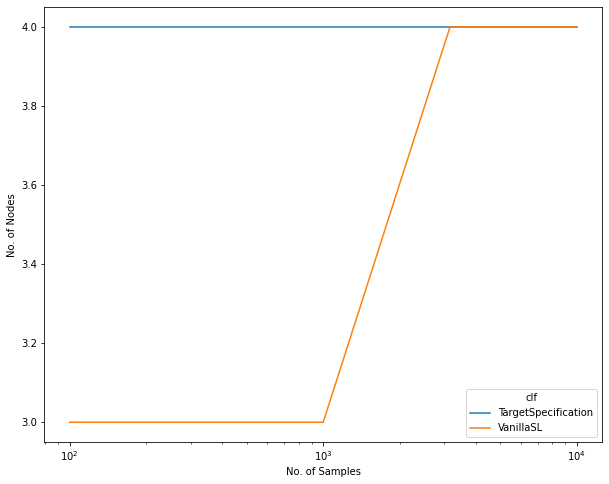

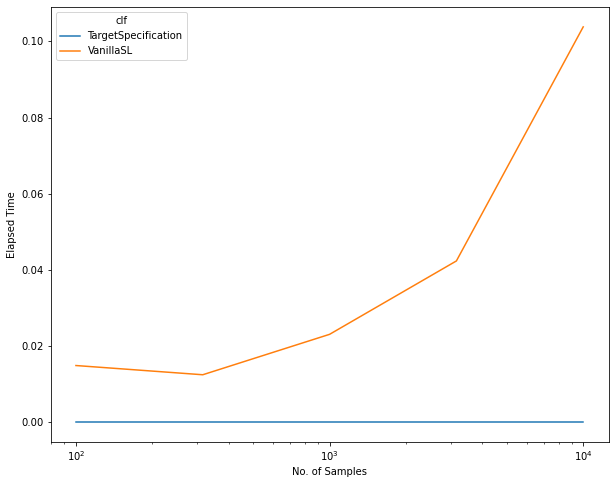

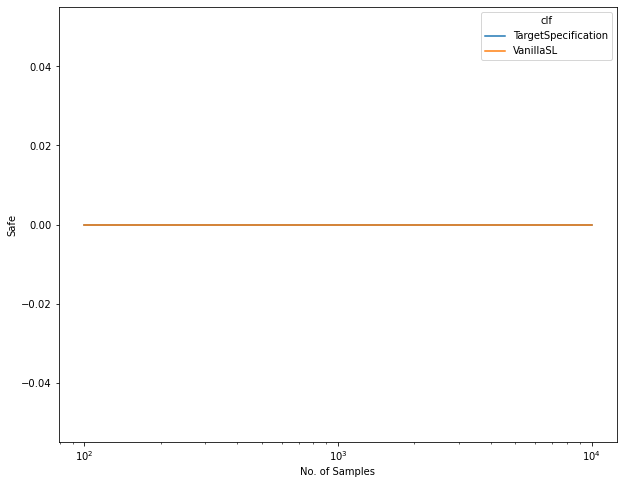

In [12]:
# Plot
evaluation.plot(x='num_samples', 
                selected_params={'p': '5.0', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
#                 logy=True,
                style={'PreprocessSL': '-o', 'PostprocessSL': '-*'})

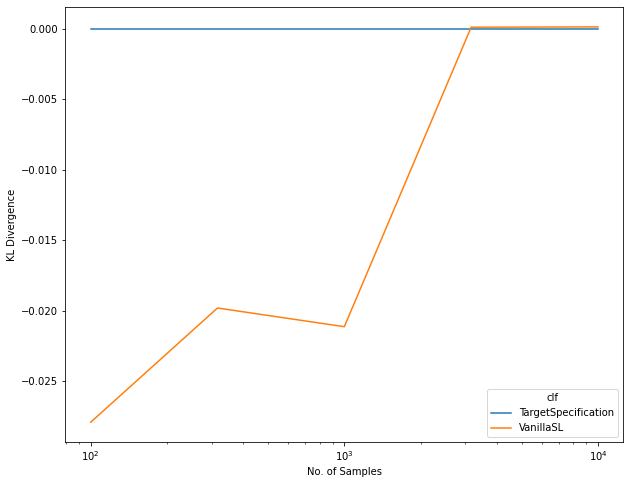

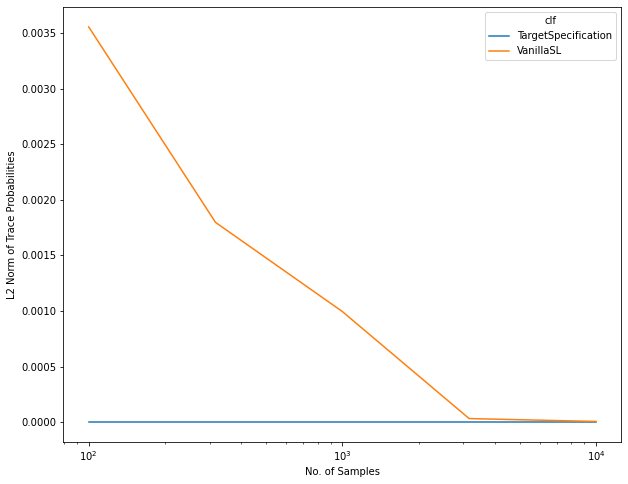

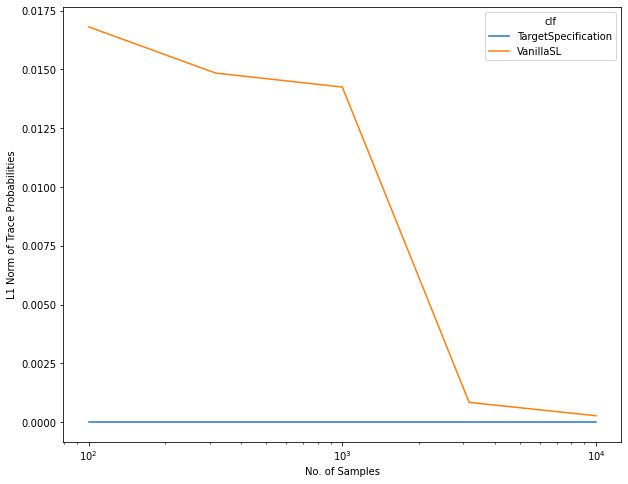

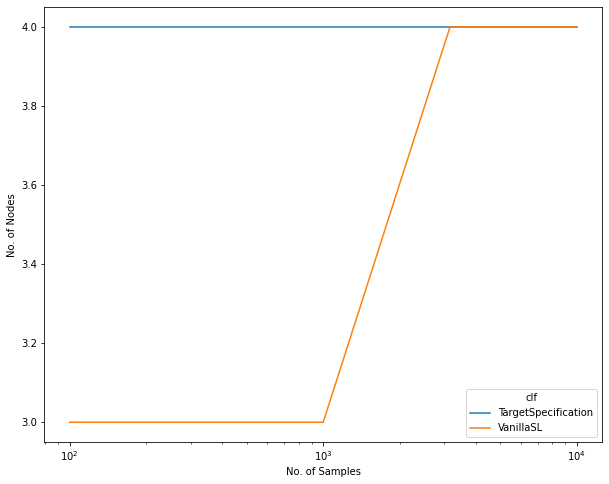

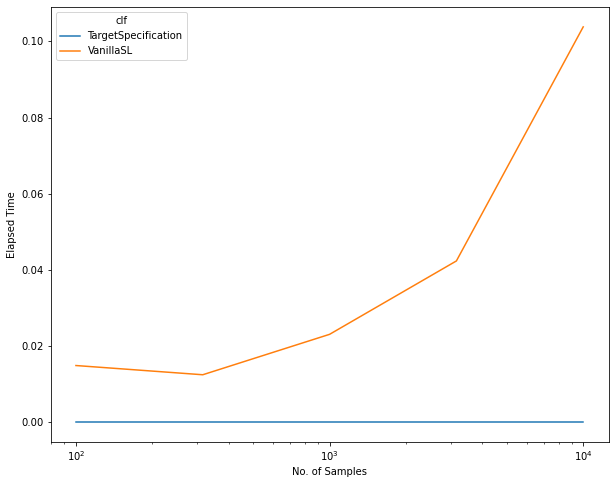

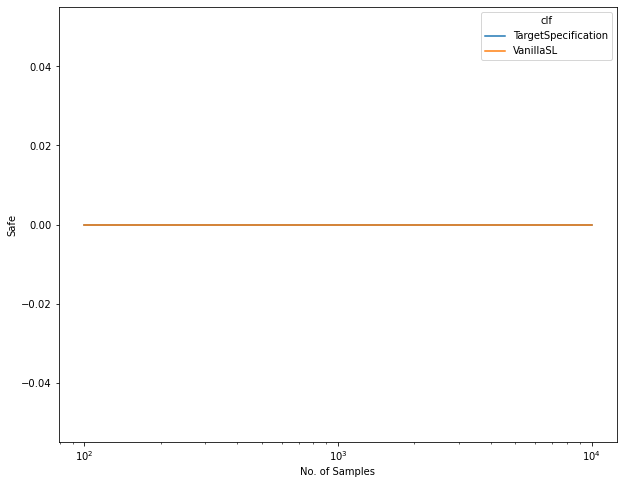

In [13]:
# Plot
evaluation.plot(x='num_samples', 
                selected_params={'p': '5.0', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
#                 logy=True,
                style={'PreprocessSL': '-o', 'PostprocessSL': '-*'})

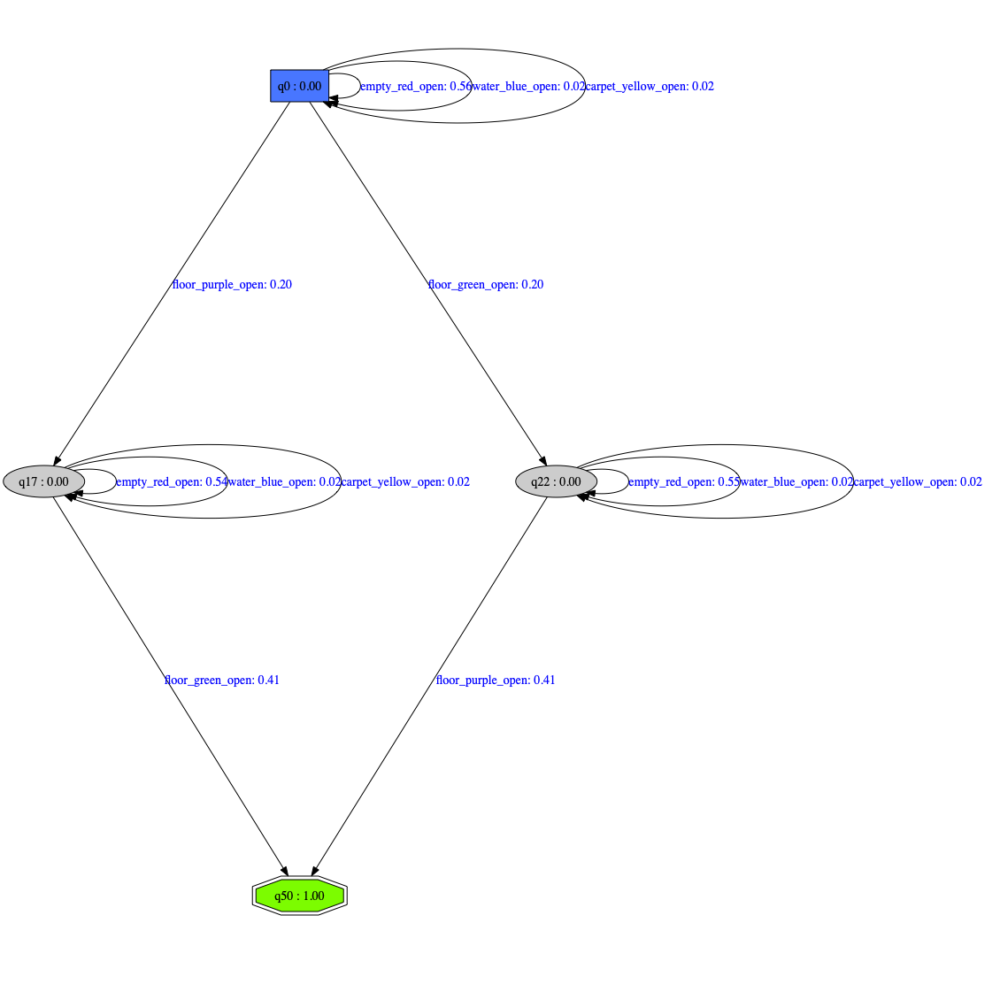

In [14]:
selected_params = {'p': '5.0',
                   'N': 20,
#                    'clf': 'PreprocessSL',
                   'clf': 'VanillaSL',
                   'num_samples': num_samples[3]}
filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

evaluation.draw(selected_params, filename=filename)

In [15]:
# selected_params = {'p': '1.0',
#                    'N': 20,
#                    'clf': 'PostprocessSL',
#                    'num_samples': num_samples[0]}
# filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

# evaluation.draw(selected_params, filename=filename)

In [16]:
def solve_environment(specification, ENV_ID, actions_type='simple_static',
                      show_figures=False, record_video=True):
    
    print('using env:', ENV_ID)
    print('using actions:', actions_type)

    env = gym.make(ENV_ID)
    env = StaticMinigridTSWrapper(env, actions_type=actions_type,
                                  monitor_log_location=GYM_MONITOR_LOG_DIR)
    env.reset()
    
    TS = active_automata.get(automaton_type='TS', graph_data=env,
                             graph_data_format='minigrid')

    if show_figures:
        env.render_notebook()
        print('underlying transition system')
        TS.draw('_'.join([EXPERIMENT_NAME, ENV_ID_1, 'TS']))

    product = active_automata.get(automaton_type='Product',
                                  graph_data=(TS, specification))
    if show_figures:
        print('product automaton')
        product.draw('_'.join([EXPERIMENT_NAME, ENV_ID, 'learned', 'product']))

    (controls,
     prob_of_controls_under_spec) = product.compute_strategy()

    print(f'Optimal Controls: {controls}')
    print(f'Probability of Generated TS Observations in Spec: ' +
          f'{prob_of_controls_under_spec}')

    (output_string,
     visited_states,
     video_path) = TS.run(controls, record_video=record_video)
    
    print(output_string)
    print(visited_states)
    if record_video:
        v = Video(video_path, embed=True,
                  html_attributes="controls muted autoplay loop")
        display(v)


using env: MiniGrid-LavaComparison_SeshiaSecondGoal-v0
using actions: simple_static


/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


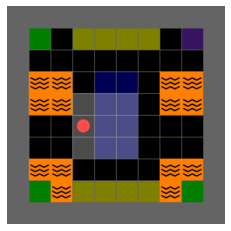

underlying transition system


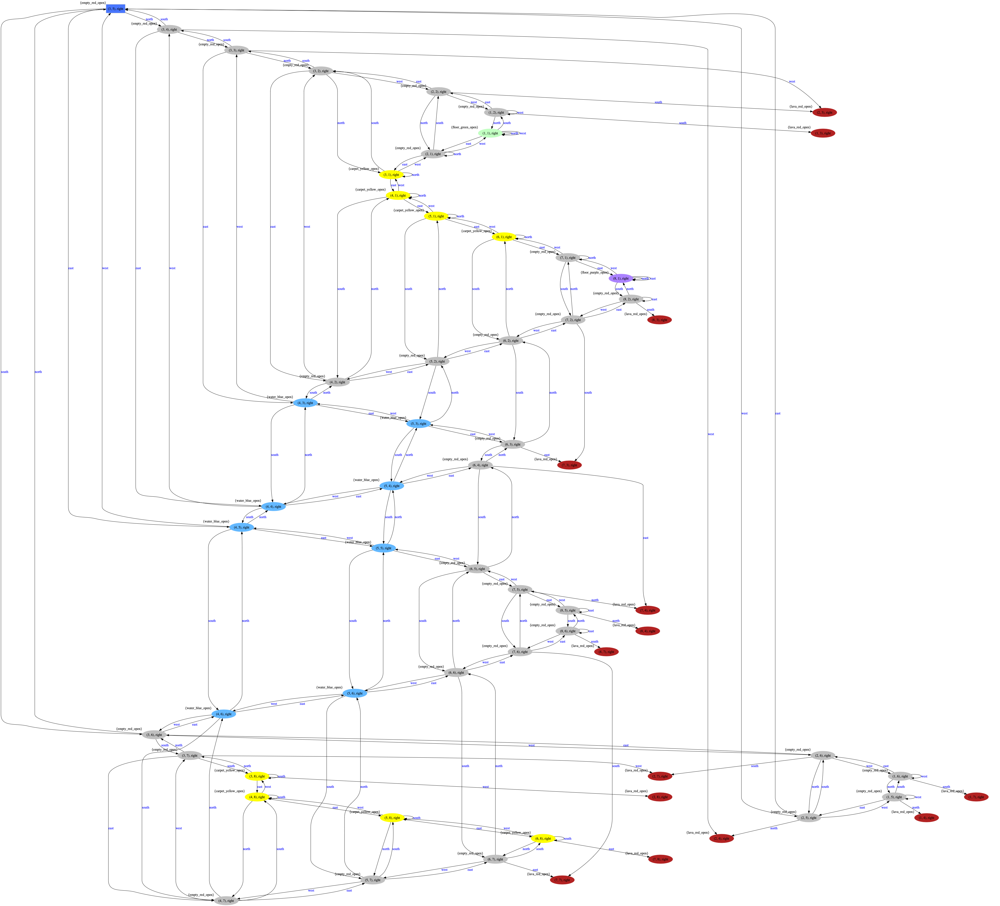

product automaton


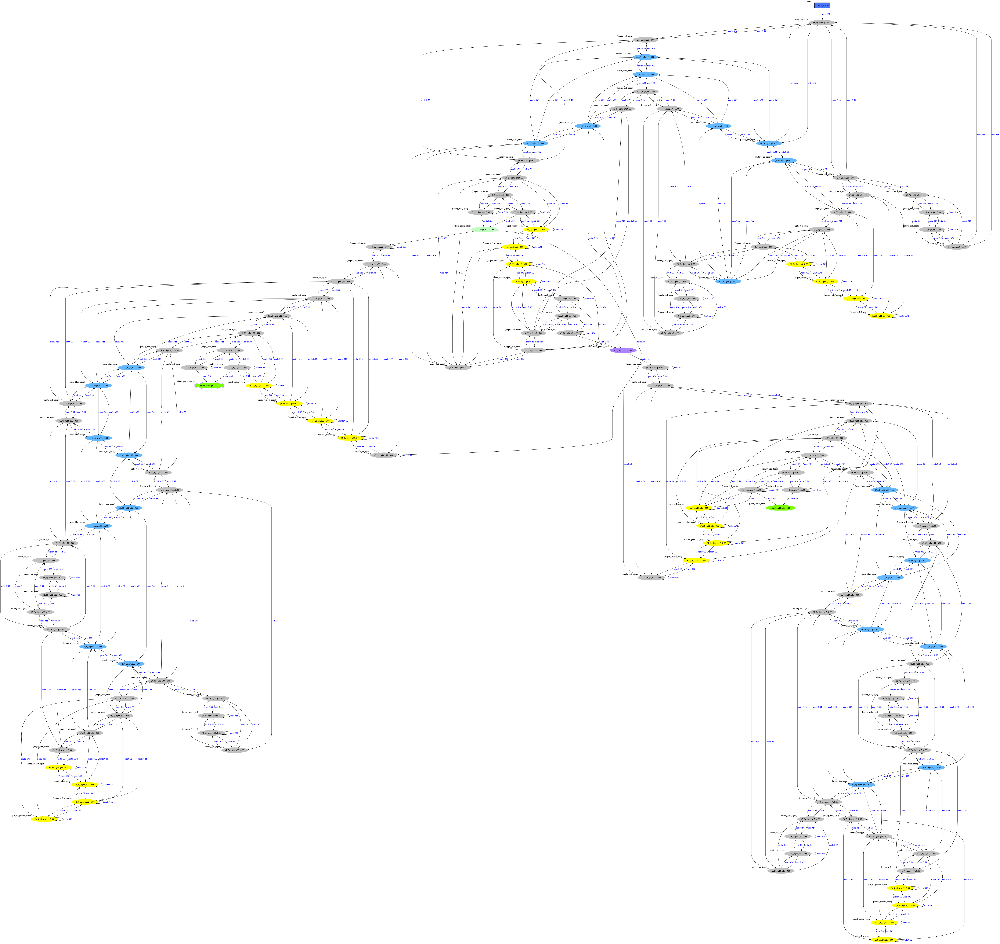


Optimal Controls: ['north', 'north', 'north', 'west', 'west', 'north', 'east', 'south', 'east', 'east', 'east', 'east', 'east', 'east', 'north']
Probability of Generated TS Observations in Spec: 2.2486699517096897e-05
['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open']
['(3, 5), right', '(3, 4), right', '(3, 3), right', '(3, 2), right', '(2, 2), right', '(1, 2), right', '(1, 1), right', '(2, 1), right', '(2, 2), right', '(3, 2), right', '(4, 2), right', '(5, 2), right', '(6, 2), right', '(7, 2), right', '(8, 2), right', '(8, 1), right']


In [17]:
selected_params = {'p': '5.0',
                   'N': 20,
#                    'clf': 'PreprocessSL',
                   'clf': 'VanillaSL',
                   'num_samples': num_samples[3]}

learned_pdfa = evaluation.pdfa(selected_params)
solve_environment(learned_pdfa, ENV_ID_0, show_figures=True)    

using env: MiniGrid-MyDistShift-v0
using actions: simple_static


/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


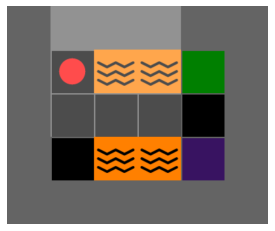

underlying transition system


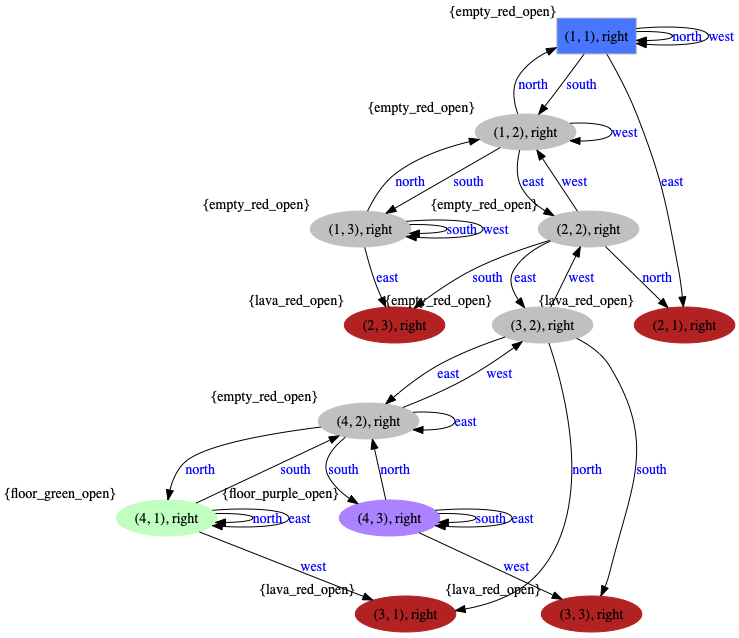

product automaton


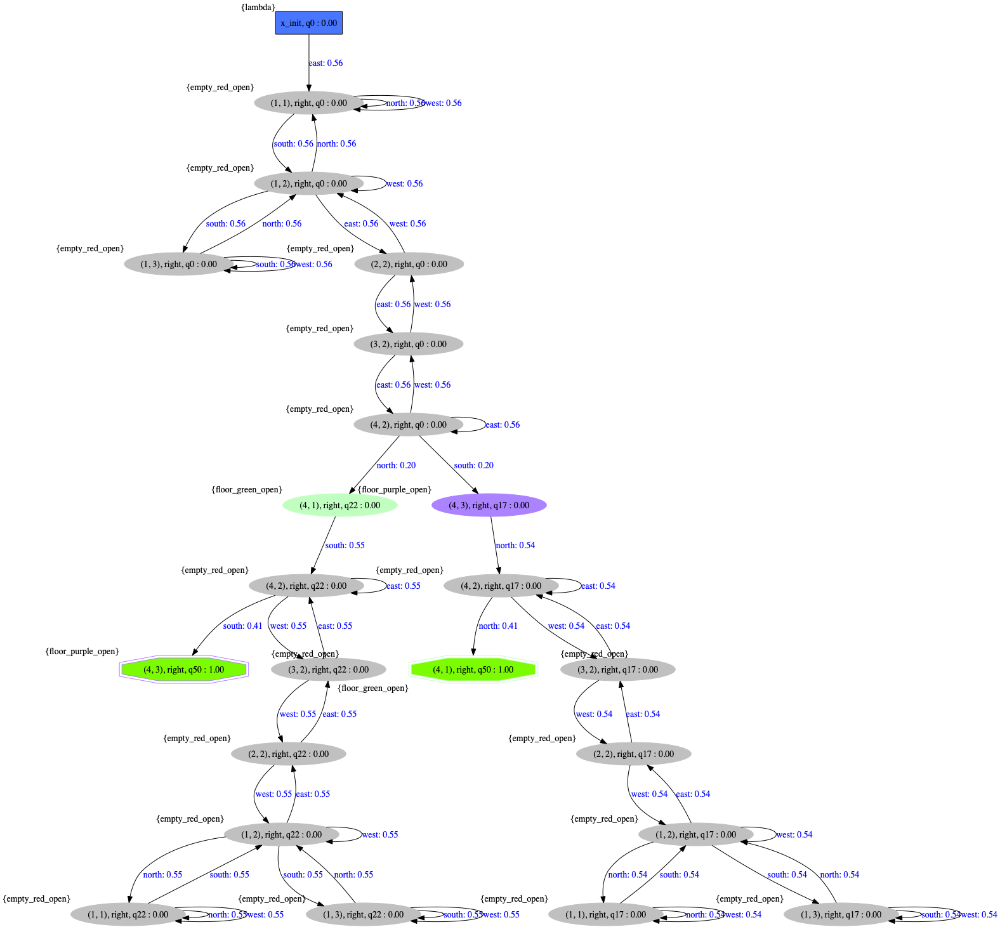


Optimal Controls: ['south', 'east', 'east', 'east', 'north', 'south', 'south']
Probability of Generated TS Observations in Spec: 0.0024946672716809645
['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open']
['(1, 1), right', '(1, 2), right', '(2, 2), right', '(3, 2), right', '(4, 2), right', '(4, 1), right', '(4, 2), right', '(4, 3), right']


In [18]:
selected_params = {'p': '5.0',
                   'N': 20,
#                    'clf': 'PreprocessSL',
                   'clf': 'VanillaSL',
                   'num_samples': num_samples[3]}

learned_pdfa = evaluation.pdfa(selected_params)
solve_environment(learned_pdfa, 'MiniGrid-MyDistShift-v0', show_figures=True)    

# Task Specification Learning from Demonstrations with Safety Specification (Comparison between methods)


/Users/kandai/Documents/projects/research/wombats_experiments/wombats/systems/minigrid.py:717: RuntimeWarning: could not find any goal objects.
  warnings.warn(msg, RuntimeWarning)


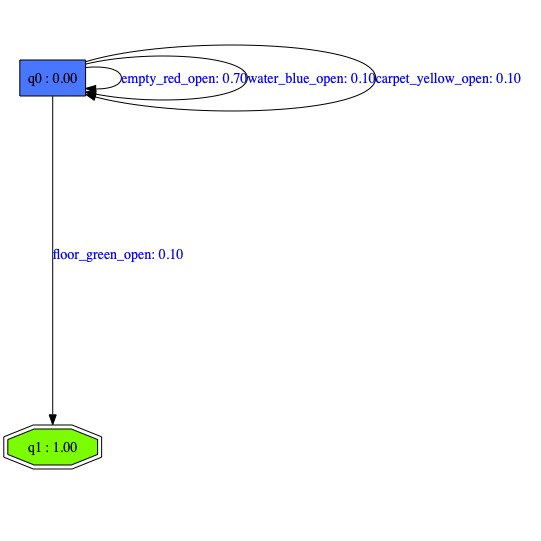

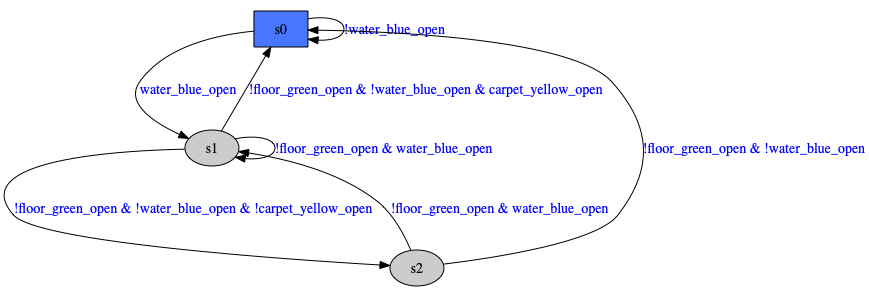

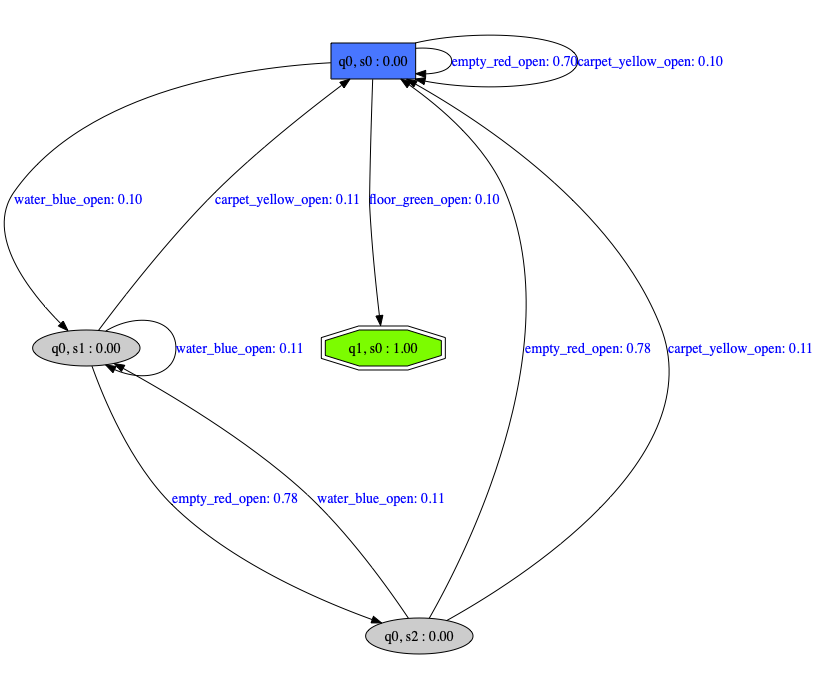

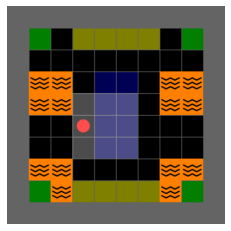

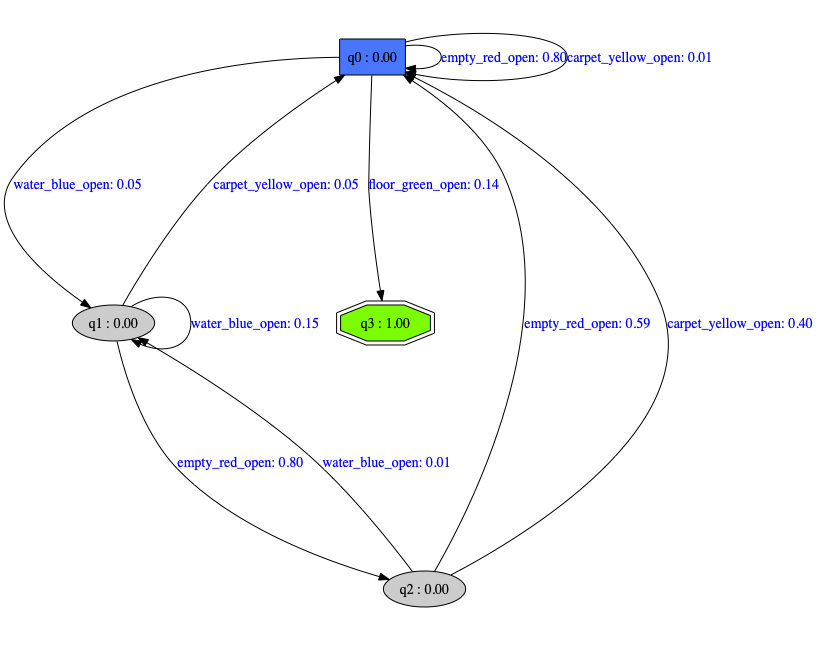

'/Users/kandai/Documents/projects/research/wombats_experiments'

In [253]:
# env

experiment_name = 'merge_safety_to_seshia_paper'
env_id = ENV_ID_1

pdfa_specification, safe_specification, _ = load_automata_from_experiment(experiment_name, env_id, draw=True)


p = Path(get_experiment_paths('merge_safety_to_seshia_paper')['PDFA_MODEL_CONFIG_FILE'])
new_pdfa_model_config_file = os.path.join(p.parent, p.stem + '_manual' + p.suffix)
manually_specified_pdfa = active_automata.get(automaton_type='PDFA',
                                              graph_data=new_pdfa_model_config_file)
manually_specified_pdfa.draw('_'.join([EXPERIMENT_NAME, env_id, 'newPDFA']))
os.getcwd()

In [53]:
datagenerator = TracesGenerator(manually_specified_pdfa, LEARNER_DATA_DIR)
param_dict = {'num_samples': num_samples,
              'N': Ns}
datagenerator.generate_datasets(param_dict)

In [65]:
# load data  & fit estimators


param_dict = {'num_samples':  num_samples}
datasets = datagenerator.select_datasets(param_dict)

# Create a pipeline
steps = [('clf', DummyEstimator())]
pipeline = Pipeline(steps=steps)

# Candidate learning algorithms and their hyperparameters
param_dict = [{'clf': [VanillaSL(), PostprocessSL(), PreprocessSL(), TargetSpecification()],
               'clf__specification': [manually_specified_pdfa],
               'clf__safe_specification': [safe_specification],
               'clf__p': ['0.6', '5']}]

estimator = BatchEstimator(pipeline, param_dict)
estimator.fit(datasets)

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99997 blue: 4 , red: 1
m99985 blue: 3 , red: 1
No Merge was successful
m99983 blue: 2 , red: 1
No Merge was successful
x132 bl

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q0, s1) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q0, s1) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q1, s1) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (empty_red_open) is not found in the curr_state's (q3, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: U

{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['floor_green_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_green_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'carpet_yellow_open', 'empty_red_op

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99997 blue: 4 , red: 1
m99985 blue: 3 , red: 1
m99983 blue: 2 , red: 1
No Merge was successful
x132 blue: 6 , red: 2
m99993 bl

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_purple_open) is not found in the curr_state's (q3, s0) transition distribution
  warnings.warn(str(e))
/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_purple_open) is not found in the curr_state's (q0, s1) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '1.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_re

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q3, s0) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '2.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'carpet_yellow_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'flo

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_purple_open) is not found in the curr_state's (q1, s1) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '5', 'clf': 'VanillaSL'}
[['floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'floor_purple_open', 'water_blue_open', 'empty_red_open', 'water_blu

{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '0.6', 'clf': 'PostprocessSL'}
[['floor_green_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'floor_purple_open', 'water_blue_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99997 blue: 4 , red: 1
m99985 blue: 3 , red: 1
m99983 blue: 2 , red: 1
No Merge was successful
x132 blue: 6 , red: 2
m99993 bl

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (water_blue_open) is not found in the curr_state's (q3, s0) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '2.0', 'clf': 'PostprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experi

loaded fdfa
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '0.6', 'clf': 'PreprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading 

loaded fdfa
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '2.0', 'clf': 'PreprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open', 'floor_purple_open'], ['empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_green_open']]
3
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0

{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '1.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '2.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 100.0, 'actual_num_samples': 100.0}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 

{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '0.6', 'clf': 'VanillaSL'}
[['floor_purple_open', 'carpet_yellow_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'water_blue_open', 'floor_green_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'em

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q1, s1) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '1.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open'

{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '2.0', 'clf': 'VanillaSL'}
[['floor_purple_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'water_blue_ope

{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'floor_purple_open'], ['floor_purple_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'e

{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '0.6', 'clf': 'PostprocessSL'}
[['floor_green_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'carpet_yellow_open', 'floor_green_open'], ['empty_red_open', 'floor_purple_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_o

{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '1.0', 'clf': 'PostprocessSL'}
[['empty_red_open', 'floor_purple_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open'], ['floor_purple_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'carpet_yellow_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open'], ['floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open'

{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '2.0', 'clf': 'PostprocessSL'}
[['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', '

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (carpet_yellow_open) is not found in the curr_state's (q3, s0) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '5', 'clf': 'PostprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'floor_purple_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open']]
3
we

loaded fdfa
{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '0.6', 'clf': 'PreprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open']]
3
welcome, running g

loaded fdfa
{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '1.0', 'clf': 'PreprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_green_open', 'floor_green_open']]
3
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -

loaded fdfa
{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '2.0', 'clf': 'PreprocessSL'}
[['water_blue_open', 'carpet_yellow_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'floor_purple_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 

loaded fdfa
{'N': 20, 'num_samples': 127.42749857031335, 'actual_num_samples': 127.42749857031335}
{'p': '5', 'clf': 'PreprocessSL'}
[['empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_

{'N': 20, 'num_samples': 162.3776739188721, 'actual_num_samples': 162.3776739188721}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open

{'N': 20, 'num_samples': 162.3776739188721, 'actual_num_samples': 162.3776739188721}
{'p': '2.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'floor_green_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'floor_purple_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_purple_open) is not found in the curr_state's (q2, s1) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 162.3776739188721, 'actual_num_samples': 162.3776739188721}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'e

{'N': 20, 'num_samples': 162.3776739188721, 'actual_num_samples': 162.3776739188721}
{'p': '0.6', 'clf': 'PostprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['floor_green_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_green_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=exper

{'N': 20, 'num_samples': 162.3776739188721, 'actual_num_samples': 162.3776739188721}
{'p': '5', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode select

loaded fdfa
{'N': 20, 'num_samples': 162.3776739188721, 'actual_num_samples': 162.3776739188721}
{'p': '0.6', 'clf': 'PreprocessSL'}
[['empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_m

loaded fdfa
{'N': 20, 'num_samples': 162.3776739188721, 'actual_num_samples': 162.3776739188721}
{'p': '2.0', 'clf': 'PreprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch 

{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'carpet_yellow_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_g

/Users/kandai/Documents/projects/research/wombats_experiments/wombats/automaton/pdfa.py:209: UserWarning: given symbol (floor_green_open) is not found in the curr_state's (q2, s1) transition distribution
  warnings.warn(str(e))


{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '1.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floo

{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['floor_green_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_r

{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '0.6', 'clf': 'PostprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'carpet_yellow_open', 'floor_green_open', 'floor_green_open'], ['water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'floor_purple_open', 'empty_red_open', 'car

{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '5', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected

loaded flexfringe
loaded fdfa
{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '1.0', 'clf': 'PreprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation cl

loaded fdfa
{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '5', 'clf': 'PreprocessSL'}
[]
0
{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '1.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '2.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 206.913808111479, 'actual_num_samples': 206.913808111479}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/

{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'carpet_yellow_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'floor_green_open'], ['water_blue_open', 'carpet_yellow_open', 'empty_red_open', 

{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '1.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'water

{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '2.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open'], ['carpet_yellow_open', 'carpet_yellow_open', 'floor_purpl

{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empt

{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '0.6', 'clf': 'PostprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'water_blue_ope

{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '2.0', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m9

loaded fdfa
{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '0.6', 'clf': 'PreprocessSL'}
[['empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open'], ['empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_perform

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99962 blue: 3 , red: 1
No Merg

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99962 blue: 3 , red: 1
No Merge 

{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '1.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '2.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 263.6650898730358, 'actual_num_samples': 263.6650898730358}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1

{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '0.6', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'water_blue_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'water_blue_open', 'empty

{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '1.0', 'clf': 'VanillaSL'}
[['water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_purple_open'], ['floor_green_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_green_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'floor_green_open', 'carpet

{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '2.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open'], ['water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_

{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '5', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'floor_purple_open'], ['carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_

{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '0.6', 'clf': 'PostprocessSL'}
[['empty_red_open', 'carpet_yellow_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['floor_green_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open', 'floor_purple_open', 'carpet_yellow_open', 'floor_purple_open']]
2
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -

{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '2.0', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m9

loaded fdfa
{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '0.6', 'clf': 'PreprocessSL'}
[['floor_green_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'empt

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99959 blue: 3 , red: 1
No Merg

loaded fdfa
{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '5', 'clf': 'PreprocessSL'}
[['empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'floor_purple_open']]
2
{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.9818286283781}
{'p': '1.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 335.9818286283781, 'actual_num_samples': 335.98182862

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99989 blue: 3 , red: 1
No Merge was successful
x550 blue: 7 , red: 2
m99994 blue: 6 , red: 2
m99993 bl

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99989 blue: 3 , red: 1
m99930 blue: 2 , red: 1
No

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99989 blue: 3 , red: 1
m99930 blue: 2 , red: 1
No Merge was successful
x380 blue: 6 , red: 2
m99996 bl

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99989 blue: 3 , red: 1
m99930 blue: 2 , red: 1
No Merge was successful
x380 blue: 6 , red: 2
m99996 blue

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99989 blue: 3 , red: 1
No Merge was successful
x550 blue: 7 , red: 2
m99994 blue: 6 , red: 2
m99993 bl

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99989 blue: 3 , red: 1
No Merge was successful
x550 blue: 7 , red: 2
m99994 blue: 6 , red: 2
m99993 bl

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99989 blue: 3 , red: 1
m99930 blue: 2 , red: 1
No

{'N': 20, 'num_samples': 428.13323987193957, 'actual_num_samples': 428.13323987193957}
{'p': '2.0', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1


node = {'label': '"State No.1210, #1"', 'style': 'dotted'} from flexfringe is blue, reading in blue states is not currently supported


/Users/kandai/Documents/projects/research/wombats_experiments/wombats/learning/training.py:341: UserWarning: Cannot train a model properly
  warnings.warn(msg)


welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99996 blue: 4 , red: 1
m99957 blue: 3 , red: 1
No Merg

node = {'label': '"State No.1210, #1"', 'style': 'dotted'} from flexfringe is blue, reading in blue states is not currently supported
'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance


loaded fdfa
{'N': 20, 'num_samples': 428.13323987193957, 'actual_num_samples': 428.13323987193957}
{'p': '5', 'clf': 'PreprocessSL'}
[]
0
{'N': 20, 'num_samples': 428.13323987193957, 'actual_num_samples': 428.13323987193957}
{'p': '0.6', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 428.13323987193957, 'actual_num_samples': 428.13323987193957}
{'p': '1.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 428.13323987193957, 'actual_num_samples': 428.13323987193957}
{'p': '2.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 428.13323987193957, 'actual_num_samples': 428.13323987193957}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_expe

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
No Merge was successful
x712 blue: 7 , red: 2
m99993 blue: 6 , red: 2
m99992 bl

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
m99931 blue: 2 , red: 1
No

{'N': 20, 'num_samples': 545.559478116852, 'actual_num_samples': 545.559478116852}
{'p': '2.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_

{'N': 20, 'num_samples': 545.559478116852, 'actual_num_samples': 545.559478116852}
{'p': '5', 'clf': 'VanillaSL'}
[['water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open'], ['empty_red_open', 'floor_green_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_o

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
No Merge was successful
x712 blue: 7 , red: 2
m99993 blue: 6 , red: 2
m99992 bl

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
No Merge was successful
x712 blue: 7 , red: 2
m99993 blue: 6 , red: 2
m99992 bl

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
m99931 blue: 2 , red: 1
No

{'N': 20, 'num_samples': 545.559478116852, 'actual_num_samples': 545.559478116852}
{'p': '5', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected

loaded fdfa
{'N': 20, 'num_samples': 545.559478116852, 'actual_num_samples': 545.559478116852}
{'p': '0.6', 'clf': 'PreprocessSL'}
[['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'water_blue_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'floor_purple_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_

{'N': 20, 'num_samples': 545.559478116852, 'actual_num_samples': 545.559478116852}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99988 blue: 3 , red: 1
No Merge was successful
x890 blue: 7 , red: 2
m99993 blue: 6 , red: 2
m99989 bl

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99988 blue: 3 , red: 1
m99931 blue: 2 , red: 1
No

{'N': 20, 'num_samples': 695.1927961775606, 'actual_num_samples': 695.1927961775606}
{'p': '2.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'floor_green_open', 'empty_red_open', 'water_blue_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'water_blue_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open',

{'N': 20, 'num_samples': 695.1927961775606, 'actual_num_samples': 695.1927961775606}
{'p': '5', 'clf': 'VanillaSL'}
[['floor_purple_open', 'carpet_yellow_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'empty_red_open', 'floor_green_open'], ['water_blue_open', 'empty_red_open', 'floor_green_open', 'floor_green_open', 'empty_red_open', 'floor_purple_open'], ['water_blue_open', 'empty_red_open', 'carpet_yellow_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'floor_green_open'], ['floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99988 blue: 3 , red: 1
No Merge was successful
x890 blue: 7 , red: 2
m99993 blue: 6 , red: 2
m99989 bl

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99988 blue: 3 , red: 1
No Merge was successful
x890 blue: 7 , red: 2
m99993 blue: 6 , red: 2
m99989 bl

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99988 blue: 3 , red: 1
m99931 blue: 2 , red: 1
No

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99988 blue: 3 , red: 1
m99931 blue: 2 , red: 1
No Merge was successful
x592 blue: 6 , red: 2
No Merge 

loaded fdfa
{'N': 20, 'num_samples': 695.1927961775606, 'actual_num_samples': 695.1927961775606}
{'p': '0.6', 'clf': 'PreprocessSL'}
[['empty_red_open', 'floor_green_open', 'water_blue_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open']]
1
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1

{'N': 20, 'num_samples': 695.1927961775606, 'actual_num_samples': 695.1927961775606}
{'p': '2.0', 'clf': 'TargetSpecification'}
[]
0
{'N': 20, 'num_samples': 695.1927961775606, 'actual_num_samples': 695.1927961775606}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldist

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
No Merge was successful
x1156 blue: 7 , red: 2
m99994 blue: 6 , red: 2
m99989 b

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
m99929 blue: 2 , red: 1
No

{'N': 20, 'num_samples': 885.8667904100823, 'actual_num_samples': 885.8667904100823}
{'p': '2.0', 'clf': 'VanillaSL'}
[['empty_red_open', 'empty_red_open', 'carpet_yellow_open', 'carpet_yellow_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'water_blue_open', 'empty_red_open', 'empty_red_open', 'floor_green_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'water_blue_open', 'empty_red_open', 'floor_green_open', 'carpet_yellow_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'empty_red_open', 'floor_purple_open'], ['floor_gre

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
m99929 blue: 2 , red: 1
No Merge was successful
x768 blue: 6 , red: 2
No Merge wa

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
No Merge was successful
x1156 blue: 7 , red: 2
m99994 blue: 6 , red: 2
m99989 b

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
No Merge was successful
x1156 blue: 7 , red: 2
m99994 blue: 6 , red: 2
m99989 b

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99986 blue: 3 , red: 1
m99929 blue: 2 , red: 1
No

{'N': 20, 'num_samples': 885.8667904100823, 'actual_num_samples': 885.8667904100823}
{'p': '2.0', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m9

node = {'label': '"State No.1089, #1"', 'style': 'dotted'} from flexfringe is blue, reading in blue states is not currently supported
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mo

node = {'label': '"State No.1089, #1"', 'style': 'dotted'} from flexfringe is blue, reading in blue states is not currently supported
'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance


welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
No Merge was successful
x1486 blue: 7 , red: 2
m99995 blue: 6 , red: 2
m99990 b

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
No Merge was successful
x1486 blue: 7 , red: 2
m99995 blue: 6 , red: 2
m99990 b

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
m99928 blue: 2 , red: 1
No

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
m99928 blue: 2 , red: 1
No Merge was successful
x910 blue: 6 , red: 2
No Merge 

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
m99928 blue: 2 , red: 1
No Merge was successful
x910 blue: 6 , red: 2
No Merge wa

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
No Merge was successful
x1486 blue: 7 , red: 2
m99995 blue: 6 , red: 2
m99990 b

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
No Merge was successful
x1486 blue: 7 , red: 2
m99995 blue: 6 , red: 2
m99990 b

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99983 blue: 3 , red: 1
m99928 blue: 2 , red: 1
No

{'N': 20, 'num_samples': 1128.8378916846884, 'actual_num_samples': 1128.8378916846884}
{'p': '2.0', 'clf': 'PostprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1


loaded fdfa
{'N': 20, 'num_samples': 1128.8378916846884, 'actual_num_samples': 1128.8378916846884}
{'p': '0.6', 'clf': 'PreprocessSL'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -S=wombats/config/DFA_safe_pdfa_learning_performance_analysis.yaml -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 -C=0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
ba

{'N': 20, 'num_samples': 1128.8378916846884, 'actual_num_samples': 1128.8378916846884}
{'p': '5', 'clf': 'TargetSpecification'}
[]
0
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , r

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=0.6 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99987 blue: 3 , red: 1
No Merge was successful
x1878 blue: 7 , red: 2
m99994 blue: 6 , red: 2
m99990 b

'NoneType' object has no attribute 'generate_traces'
welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=1.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99987 blue: 3 , red: 1
m99926 blue: 2 , red: 1
No

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=2.0 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99987 blue: 3 , red: 1
m99926 blue: 2 , red: 1
No Merge was successful
x1192 blue: 6 , red: 2
No Merge

welcome, running git commit c8fad5bd3b0c0dad0e28ec7606f20a7fcf975071 with: dfasat/flexfringe -h=kldistance -d=kl_data -n=2 -x=0 -w=0 -b=1 -f=1 -I=0 -t=0 -l=0 -q=0 -y=0 -N=0 -T=1 -p=5 --output-dir=experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/dfa /Users/kandai/Documents/projects/research/wombats_experiments/experiments/safe_pdfa_learning_performance_analysis/flexfringe_data/train 
valid: kldistance
aic 1
alergia 1
alergia94 1
conflict_driven 1
conflict_edsm_driven 1
conflict_overlap_driven 1
count_driven 1
depth_driven 1
evidence_driven 1
fixed_depth_mse_error 1
full_overlap_driven 1
kldistance 1
likelihoodratio 1
mealy 1
mse_error 1
overlap4logs 1
overlap_driven 1
process_mining 1
Using heuristic kldistance
Creating apta using evaluation class kl_data
batch mode selected
reading data finished, processing:
dfasat running
blue: 5 , red: 1
m99995 blue: 4 , red: 1
m99987 blue: 3 , red: 1
m99926 blue: 2 , red: 1
No Merge was successful
x1192 blue: 6 , red: 2
No Merge w

AttributeError: 'FlexfringeInterface' object has no attribute 'average_elapsed_time'

In [ ]:
evaluation = ComparativeEvaluation(estimator.experiments)

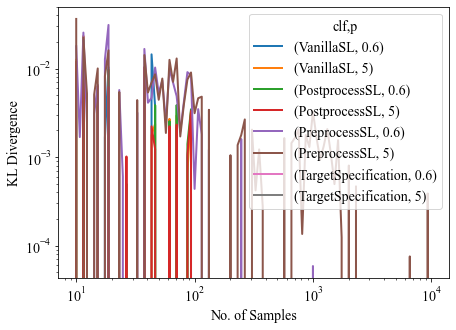

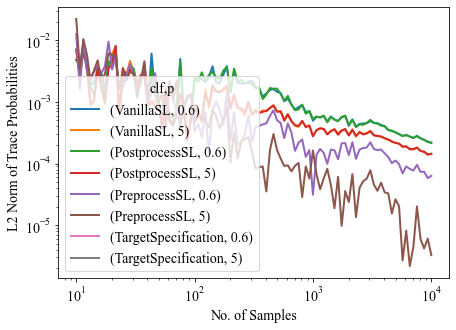

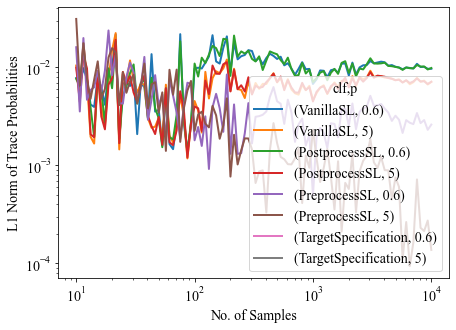

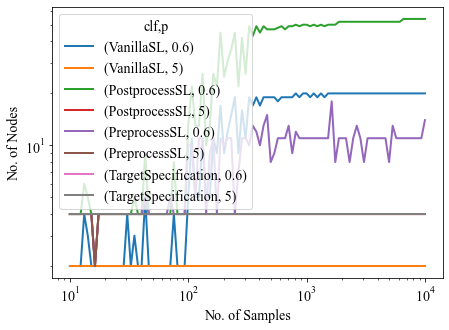

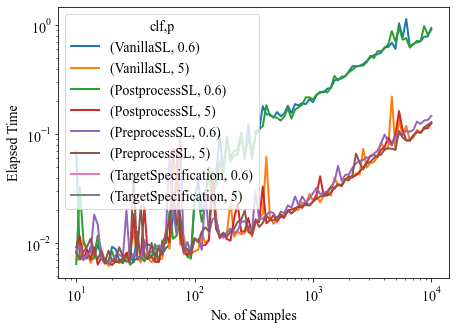

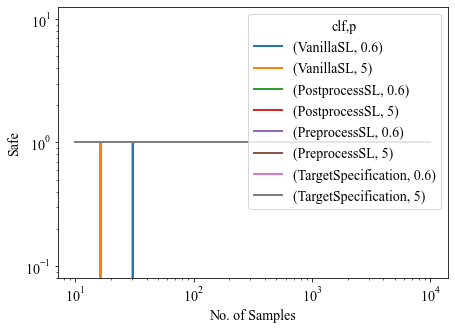

In [104]:
plt.rcParams["font.size"] = 14
plt.rcParams["font.weight"] = 'normal'
plt.rcParams["font.family"] = 'Times New Roman'

# Plot
evaluation.plot(x='num_samples', 
#                 selected_params={'p': '0.6', 'N': 20}, 
                selected_params={'N': 20}, 
                figsize=(7, 5), 
                logx=True,
                logy=True,
                lw=2,
#                 legend=False,
#                 fontsize=16,
                style={'PreprocessSL': '-o', 'PostprocessSL': '-*'})


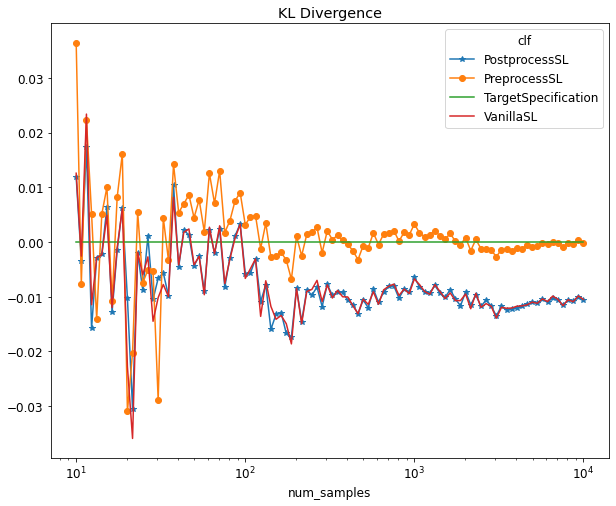

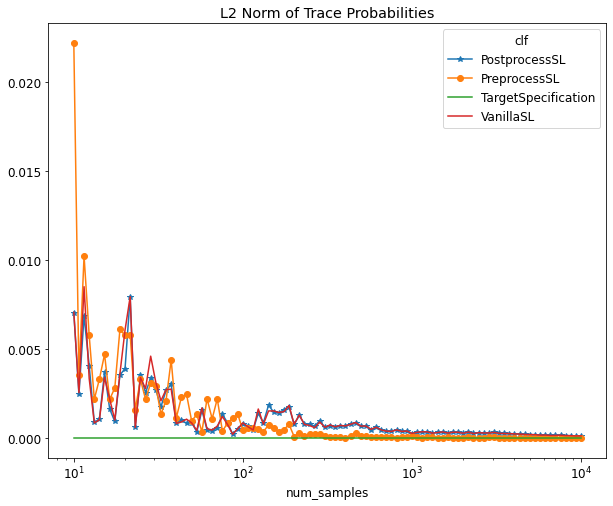

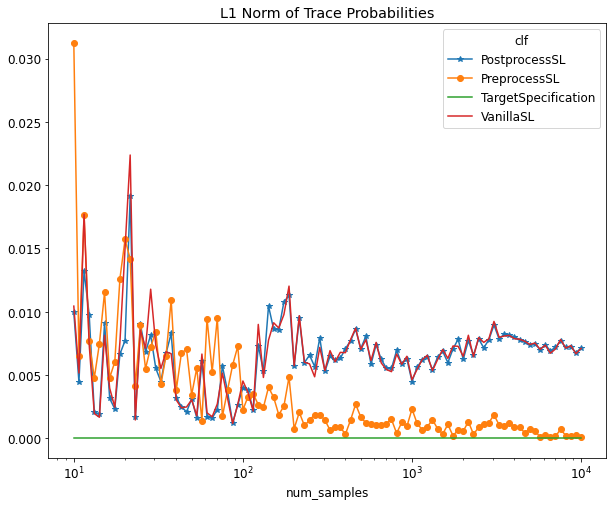

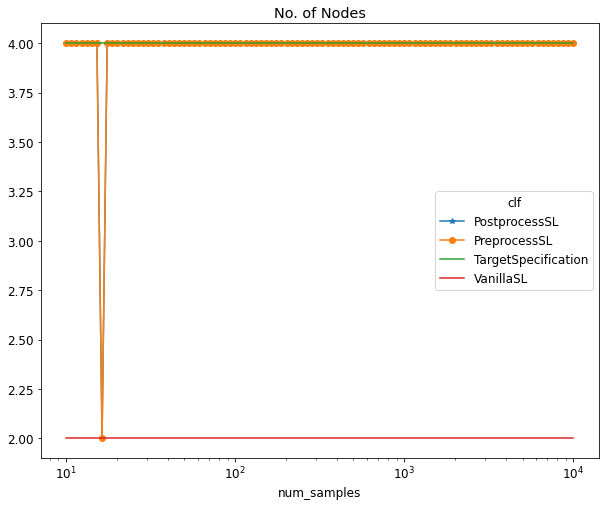

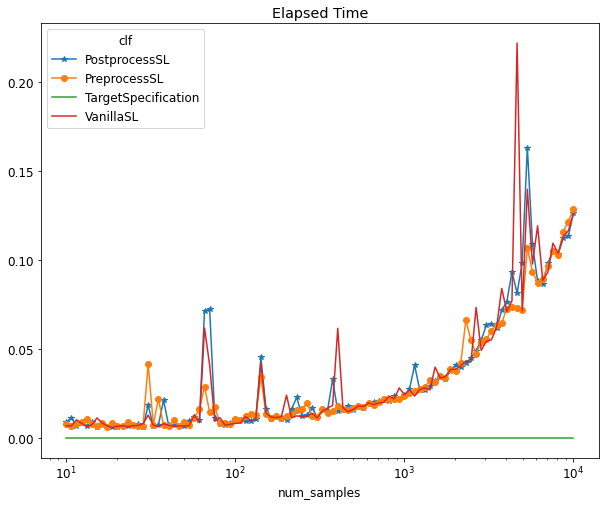

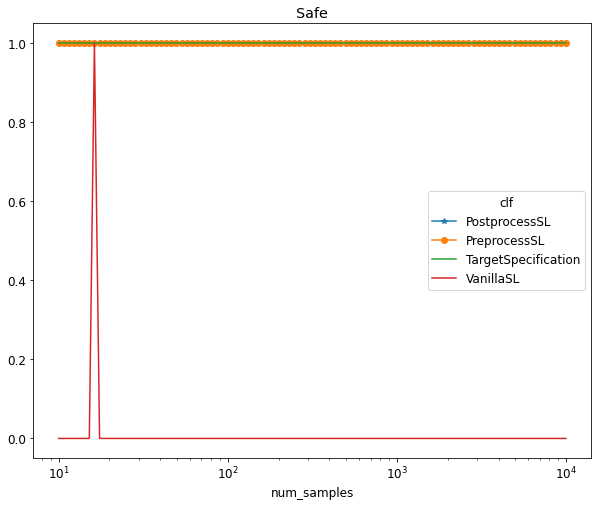

In [91]:
evaluation.plot(x='num_samples', 
                selected_params={'p': '5', 'N': 20}, 
                figsize=(10, 8), 
                logx=True,
#                 logy=True,
                style={'PreprocessSL': '-o', 'PostprocessSL': '-*'})


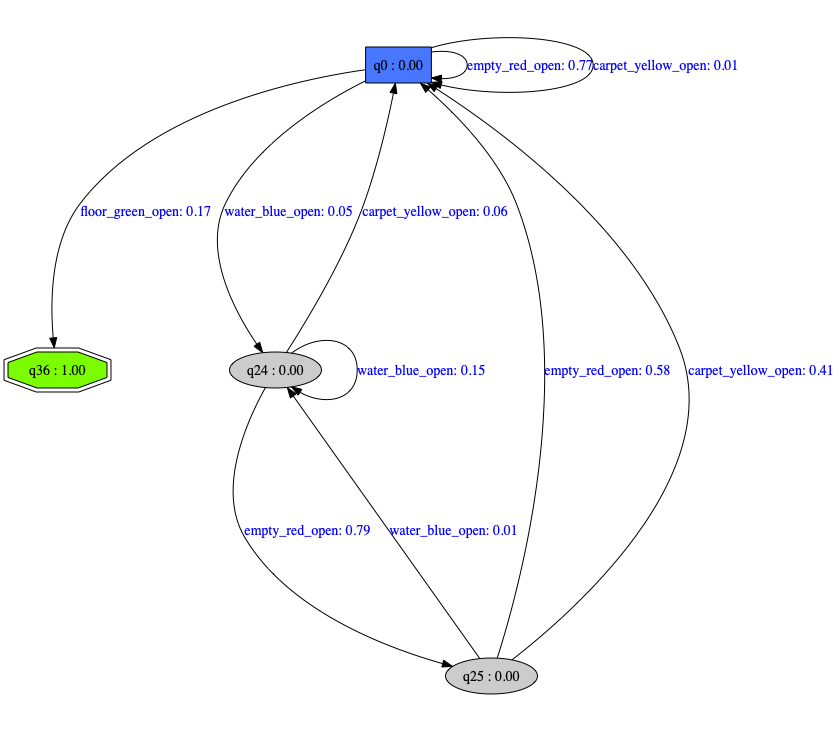

In [58]:
selected_params = {'p': '5',
                   'N': 20,
                   'clf': 'PreprocessSL',
                   'num_samples': num_samples[-1]}
filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

evaluation.draw(selected_params, filename=filename)

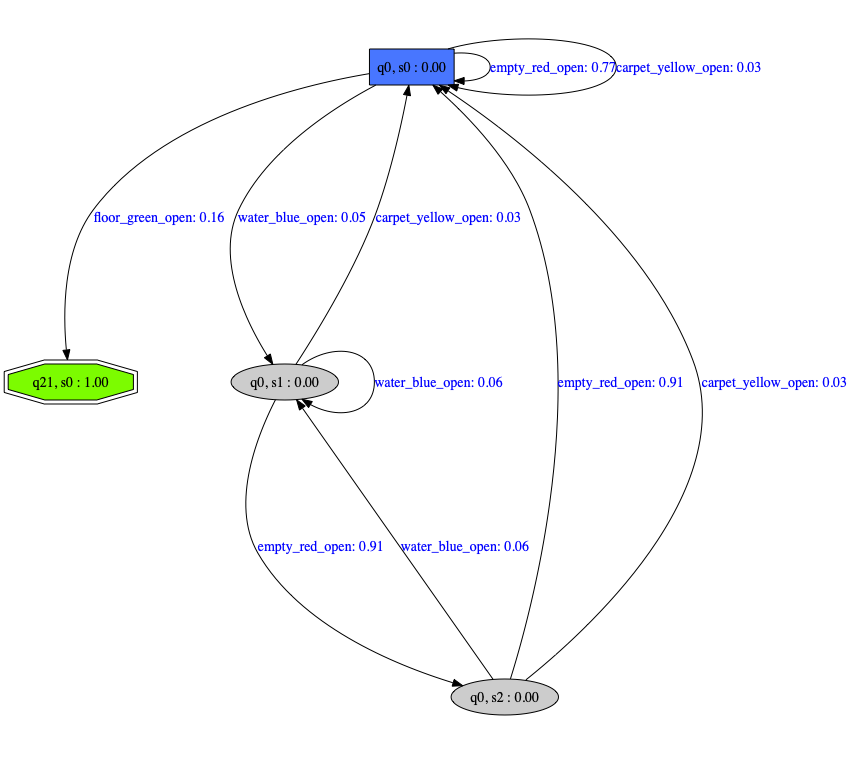

In [59]:
selected_params = {'p': '5',
                   'N': 20,
                   'clf': 'PostprocessSL',
                   'num_samples': num_samples[90]}
filename = '_'.join([EXPERIMENT_NAME, env_id, 'learnedPDFA'])

evaluation.draw(selected_params, filename=filename)

In [39]:
n_experiment = -5
dataset = estimator.experiments[n_experiment].dataset
transitionCounts = {}
def print_sample_probability(pdfa, traces):
    start_state = pdfa.start_state
    # Count all transitions from each node in the train sets
    for trace in traces:

        curr_state = start_state
        trace_prob = 1.0
    #     print(trace)

        for symbol in trace:
            next_state, _ = pdfa._get_next_state(curr_state, symbol)

            if curr_state not in transitionCounts:
                transitionCounts[curr_state] = {}
            if symbol not in transitionCounts[curr_state]:
                transitionCounts[curr_state][symbol] = 0

            transitionCounts[curr_state][symbol] += 1
            curr_state = next_state

    # Now compare against the actual distribution
    for curr_state, eachNodeTransitions in transitionCounts.items():
        sum_counts = sum(list(eachNodeTransitions.values()))
        for symbol, counts in eachNodeTransitions.items():
            next_state, y_true = pdfa._get_next_state(curr_state, symbol)
            y_pred = counts / sum_counts

            print(f'({curr_state}, {next_state}, {symbol:<20s}): GroundTruth={y_true:3f}, Pred={y_pred:4f}')

print_sample_probability(manually_specified_pdfa, dataset.X_train)
# print()
# print_sample_probability(manually_specified_pdfa, dataset.X_test)

(q0, q0, empty_red_open      ): GroundTruth=0.800000, Pred=0.768620
(q0, q3, floor_green_open    ): GroundTruth=0.140000, Pred=0.175871
(q0, q1, water_blue_open     ): GroundTruth=0.050000, Pred=0.045309
(q0, q0, carpet_yellow_open  ): GroundTruth=0.010000, Pred=0.010200
(q1, q0, carpet_yellow_open  ): GroundTruth=0.050000, Pred=0.052109
(q1, q2, empty_red_open      ): GroundTruth=0.800000, Pred=0.807279
(q1, q1, water_blue_open     ): GroundTruth=0.150000, Pred=0.140612
(q2, q0, empty_red_open      ): GroundTruth=0.590000, Pred=0.596824
(q2, q0, carpet_yellow_open  ): GroundTruth=0.400000, Pred=0.394467
(q2, q1, water_blue_open     ): GroundTruth=0.010000, Pred=0.008709


In [ ]:
experiment_name = 'merge_safety_to_seshia_paper_twogoals'
env_id = ENV_ID_1

pdfa_specification, safe_specification, _ = load_automata_from_experiment(experiment_name, env_id, draw=True)